# Data Science Course - Project: EEG data

## Importing libraries and installing required libraries
In order to perform most of the modeling using different models, we need to get `sklearn`, `matplotlib`, and `mlxtend` library.

In [1]:
# !pip install scikit-learn  -U --user
# !pip install mlxtend

In [2]:
# Import all the required libraries
import pandas as pd
import numpy as np
from pathlib import Path
import json

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import roc_curve, roc_auc_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn import tree

from mlxtend.feature_selection import SequentialFeatureSelector as sfs

from IPython.display import display
from matplotlib import pyplot as plt

## Reading and Processing Data

In [3]:
# Read in both excel files for 12 and 24 hour datasets
df_12hr = pd.read_excel("featuresNEW_12hrs.xls")
df_24hr = pd.read_excel("featuresNEW_24hrs.xls")
display(df_12hr.head())
display(df_24hr.head())

,Patient Outcome,Nonlinear energy,Activity,Mobility,Complexity,RMS Amplitude,kurtosis,skewness,meanAM,stdAM,...,sef,df,svd_ent,H_spec,SE,saen,abs(renyi),abs(shan),perm_entr,FD
0,0,6.381825,29.755446,0.408301,2.897726,5.366760,5.745661,-0.498812,59.551692,101.820196,...,0.256897,0.546552,3.482561,5.385360,0.702795,0.799193,13.427809,69.161258,0.692778,1.523232
1,0,8.434789,117.289335,0.517105,3.144103,7.448673,6.139682,-0.084028,234.689385,462.799923,...,0.256897,0.922414,3.399488,5.350676,0.697865,0.916383,13.228661,66.398887,0.692703,1.655553
2,0,1.420924,4.314372,0.601364,2.513006,1.867036,5.966349,-0.273994,8.632826,18.834429,...,0.284483,0.987931,3.693560,5.810123,0.739743,1.396126,12.310336,74.056516,0.692844,1.726974
3,0,0.081762,0.166315,0.810457,1.805010,0.406380,3.049119,-0.011966,0.332706,0.341682,...,0.398276,0.843103,3.964580,6.552682,0.812399,1.876191,11.024560,102.255567,0.692851,1.787456
4,1,6.678718,49.564944,0.352367,3.353944,6.992962,3.440489,-0.322447,99.230193,113.868248,...,0.229310,0.451724,3.365842,4.701857,0.697125,0.934298,13.846035,98.649180,0.692812,1.517652


,Patient Outcome,Nonlinear energy,Activity,Mobility,Complexity,RMS Amplitude,kurtosis,skewness,meanAM,stdAM,...,sef,df,svd_ent,H_spec,SE,saen,abs(renyi),abs(shan),perm_entr,FD
0,0,7.208353,37.526548,0.359961,2.980866,6.036699,6.335582,-0.540382,75.105874,133.159679,...,0.289655,0.713793,3.382011,5.324045,0.659244,0.770788,13.458602,61.982834,0.692841,1.488294
1,0,13.675693,109.911766,0.283558,2.970833,10.442140,4.726694,-0.912576,219.961053,290.525559,...,0.241379,0.512069,3.105410,4.859528,0.653310,0.451265,14.067348,78.314437,0.692756,1.304490
2,0,5.347634,55.435353,0.268718,3.515268,7.403381,3.628424,-0.256937,110.992133,133.241780,...,0.248276,0.574138,3.095616,4.706280,0.616924,0.671550,13.822808,94.582353,0.692745,1.318972
3,1,9.391564,52.440349,0.365924,2.617295,7.227340,2.999731,-0.043711,104.939039,105.529633,...,0.325862,0.837931,3.281190,5.310083,0.672564,0.978945,13.903877,105.957303,0.692698,1.298491
4,1,44.218016,141.589980,0.453004,2.029035,11.795120,2.935374,-0.019431,283.248429,292.085473,...,0.587931,1.775862,3.428089,5.695084,0.678737,1.110032,14.391242,108.511203,0.692736,1.375676


> Splitting datasets into x and y dataframes. x dataframe representing the input and the y dataframe representing the classes/output.

In [4]:
x_12 = df_12hr.drop('Patient Outcome', axis=1)
y_12 = df_12hr['Patient Outcome']

x_24 = df_24hr.drop('Patient Outcome', axis=1)
y_24 = df_24hr['Patient Outcome']

In [5]:
# Check if there are missing values.
# There are no missing values, so we can continue
print('x - 12 hours. Null values? ', not np.all(x_12.isna().sum().values == 0))
print('y - 12 hours. Null values? ', not np.all(y_12.isna().sum() == 0))
print('x - 24 hours. Null values? ', not np.all(x_24.isna().sum().values == 0))
print('y - 24 hours. Null values? ', not np.all(y_24.isna().sum() == 0))

x - 12 hours. Null values?  False
y - 12 hours. Null values?  False
x - 24 hours. Null values?  False
y - 24 hours. Null values?  False


## Defining various models

#### Useful functions to draw ROC curve, draw confusion matrix and find specificity with Confidence Interval

In [6]:
# Drawing the ROC curve given the ground truth and prediction
def drawROC(y_test, y_pred, y_pred_threshold, threshold, title):
    y_fp_thresh, y_tp_thresh, _ = roc_curve(y_test, y_pred_threshold[0], drop_intermediate=False, pos_label=1)

    figure, axis = plt.subplots(1, 2, figsize=(16, 8))

    axis[0].set_title('ROC Plot (Good Outcome - Class 1) \n {title} - w/ threshold {thresh} \nROC AUC Score: {score}'.format(title = title, thresh = threshold[0], score = roc_auc_score(y_test, y_pred_threshold[0])))
    axis[0].plot(y_fp_thresh, y_tp_thresh)
    axis[0].plot([0, 1], ls="--")
    axis[0].plot([0, 0], [1, 0], c=".7"), axis[0].plot([1, 1], c=".7")
    axis[0].set_ylabel('True Positive Rate')
    axis[0].set_xlabel('False Positive Rate')

    y_fp_thresh, y_tp_thresh, _ = roc_curve(y_test, y_pred_threshold[1], drop_intermediate=False, pos_label=0)

    axis[1].set_title('ROC Plot (Bad Outcome - Class 0) \n {title} - w/ threshold of {thresh} \nROC AUC Score: {score}'.format(title = title, thresh = threshold[1], score = roc_auc_score(y_test, y_pred_threshold[1])))
    axis[1].plot(y_fp_thresh, y_tp_thresh)
    axis[1].plot([0, 1], ls="--")
    axis[1].plot([0, 0], [1, 0], c=".7"), axis[1].plot([1, 1], c=".7")
    axis[1].set_ylabel('True Positive Rate')
    axis[1].set_xlabel('False Positive Rate')
    plt.show()


def confidence_interval(input, ratio):
    # CI calculation according to
    # https://www.wikihow.com/Calculate-95%25-Confidence-Interval-for-a-Test's-Sensitivity
    CI = 1-input
    CI = CI*input
    CI = CI/ratio
    CI = np.sqrt(CI)
    CI = CI*1.96
    CI = round(CI, 2)
    return CI


def findSpecificity(y_test, y_pred, y_pred_threshold, threshold, title):
    f, axes = plt.subplots(1, 2, figsize=(20, 5))
    cm_thresh = confusion_matrix(y_test, y_pred_threshold[0], labels=[0,1])

    disp = ConfusionMatrixDisplay.from_predictions(y_test, y_pred_threshold[0], colorbar=False, ax=axes[0], cmap='Blues', labels=[0,1])
    sensitivity = cm_thresh[0, 0]/(cm_thresh[0, 0]+cm_thresh[0, 1])
    specificity = cm_thresh[1, 1]/(cm_thresh[1, 0]+cm_thresh[1, 1])
    disp.ax_.set_title('{title} (Good Outcome - Class 1) w/ Threshold of {thresh}: \nSpecificity - {spec} +-{confid_spec}, Sensitivity - {sens} +-{confid_sens}'
                       .format(title=title, thresh=threshold[0], spec=specificity,
                               confid_spec=confidence_interval(specificity, cm_thresh[0, 0]),
                               sens=sensitivity,
                               confid_sens=confidence_interval(sensitivity, cm_thresh[1, 1])))

    cm_thresh = confusion_matrix(y_test, y_pred_threshold[1], labels=[1,0])
    disp = ConfusionMatrixDisplay.from_predictions(y_test, y_pred_threshold[1], colorbar=False, ax=axes[1], cmap='Blues', labels=[1,0])
    sensitivity = cm_thresh[0, 0]/(cm_thresh[0, 0]+cm_thresh[0, 1])
    specificity = cm_thresh[1, 1]/(cm_thresh[1, 0]+cm_thresh[1, 1])
    disp.ax_.set_title('{title} (Bad Outcome - Class 0) w/ Threshold of {thresh}: \nSpecificity - {spec} +-{confid_spec}, Sensitivity - {sens} +-{confid_sens}'
                       .format(title=title, thresh=threshold[1], spec=specificity,
                               confid_spec=confidence_interval(specificity, cm_thresh[0, 0]),
                               sens=sensitivity,
                               confid_sens=confidence_interval(sensitivity, cm_thresh[1, 1])))

    # print('The G-Mean value is:', np.sqrt(sensitivity * specificity))
    plt.show()

#### GridSearchCV to find best parameters

In [7]:
# Fine tuning models to be used
def doGridSearch(params, mod, x_train, y_train):
    grid = GridSearchCV(mod, param_grid=params,
                        cv=10, verbose=3, n_jobs=-1)
    grid.fit(x_train, y_train)
    return grid.best_params_


model_params = {}


def loadParams(x_train, y_train, data_type):
    global model_params

    MODEL_PATH = '{dtype}_model_info.json'.format(dtype=data_type)
    if Path(MODEL_PATH).is_file():
        with open(MODEL_PATH) as json_file:
            model_params = json.load(json_file)
    else:
        # Fine tuning logistic regression
        print('Logistic Regression:')
        log_mod = LogisticRegression()
        param_dict = {
            "solver": ['newton-cg', 'liblinear', 'lbfgs'],
            "C": [0.01, 0.1, 1, 10],
            "random_state": [0]
        }
        model_params['logistic'] = doGridSearch(param_dict, log_mod, x_train, y_train)

        # Fine tuning decision tree regression
        print('Decision Tree:')
        decision_tree = DecisionTreeClassifier()
        param_dict = {
            "criterion": ['gini', 'entropy'],
            "max_depth": range(1, 10),
            "min_samples_split": range(1, 10),
            "min_samples_leaf": range(1, 10),
            "random_state": [0]
        }
        model_params['decision'] = doGridSearch(param_dict, decision_tree, x_train, y_train)

        # Fine tuning random forest classification
        print('Random Forest:')
        rand_forest = RandomForestClassifier()
        param_dict = {
            "n_estimators": [200, 500],
            "max_features": ['auto', 'sqrt', 'log2'],
            "criterion": ['gini', 'entropy'],
            "max_depth": range(3, 10),
            "min_samples_leaf": range(3, 10),
            "random_state": [0]
        }
        model_params['random'] = doGridSearch(param_dict, rand_forest, x_train, y_train)

        # Fine tuning Naive Bayes
        print('Naive Bayes:')
        nv = GaussianNB()
        param_dict = {
            "var_smoothing": np.logspace(0, -9, num=100)
        }
        model_params['naive'] = doGridSearch(param_dict, nv, x_train, y_train)

        # Fine tuning SVC
        print('SVC:')
        svc_mod = SVC()
        param_dict = {
            "C": [0.01, 0.1, 1, 10, 100],
            "gamma": [1, 0.1, 0.01, 0.001],
            "kernel": ['rbf', 'sigmoid'],
            "probability": [True]
        }
        model_params['svc'] = doGridSearch(param_dict, svc_mod, x_train, y_train)
        
        print(model_params)

        # Storing all the hyperparameters for future use
        with open(MODEL_PATH, "w") as outfile:
            json.dump(model_params, outfile)

In [8]:
# Logistic Regression
def log_reg(x_train, y_train, x_test, y_test, threshold=[0.5, 0.5]):
    reg_mod = LogisticRegression(**model_params['logistic']).fit(x_train, y_train)
    print('For logistic regression:')
    print('training accuracy', reg_mod.score(x_train, y_train))
    print('testing accuracy', reg_mod.score(x_test, y_test))
    log_prob = reg_mod.predict_proba(x_test)
    log_class_prob = np.array(log_prob.T[1])

    log_pred0 = np.zeros(log_class_prob.shape)
    log_pred0[log_class_prob > threshold[0]] = 1

    log_pred1 = np.zeros(log_class_prob.shape)
    log_pred1[log_class_prob > threshold[1]] = 1

    log_pred = [log_pred0, log_pred1]

    print(classification_report(y_test, log_pred0, labels=[0,1]))
    print(classification_report(y_test, log_pred1, labels=[1,0]))
    findSpecificity(y_test, reg_mod.predict(x_test), log_pred, threshold, 'Logistic Regression')
    drawROC(y_test, reg_mod.predict(x_test), log_pred, threshold, 'Logistic Regression')
    return reg_mod


# Decision Tree model
def dec_tree(x_train, y_train, x_test, y_test, threshold=[0.5, 0.5]):
    decision_tree = DecisionTreeClassifier(**model_params['decision']).fit(x_train, y_train)
    print('For decision tree:')
    print('training accuracy', decision_tree.score(x_train, y_train))
    print('testing accuracy', decision_tree.score(x_test, y_test))
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(50, 6), dpi=500)
    tree.plot_tree(decision_tree, filled=True)
    fig.savefig('tree.jpg')
    print('The decision tree is saved!')
    tree_prob = decision_tree.predict_proba(x_test)
    tree_class_prob = np.array(tree_prob.T[1])

    tree_pred0 = np.zeros(tree_class_prob.shape)
    tree_pred0[tree_class_prob > threshold[0]] = 1

    tree_pred1 = np.zeros(tree_class_prob.shape)
    tree_pred1[tree_class_prob > threshold[1]] = 1

    tree_pred = [tree_pred0, tree_pred1]

    print(classification_report(y_test, tree_pred0, labels=[0,1]))
    print(classification_report(y_test, tree_pred1, labels=[1,0]))
    findSpecificity(y_test, decision_tree.predict(x_test), tree_pred, threshold, 'Decision Tree')
    drawROC(y_test, decision_tree.predict(x_test), tree_pred, threshold, 'Decision Tree')
    return decision_tree


# Random Forest model
def random_forest(x_train, y_train, x_test, y_test, threshold=[0.5, 0.5]):
    rand_forest = RandomForestClassifier(**model_params['random']).fit(x_train, y_train)
    print('For random forest:')
    print('training accuracy', rand_forest.score(x_train, y_train))
    print('testing accuracy', rand_forest.score(x_test, y_test))
    tree_prob = rand_forest.predict_proba(x_test)
    tree_class_prob = np.array(tree_prob.T[1])

    tree_pred0 = np.zeros(tree_class_prob.shape)
    tree_pred0[tree_class_prob > threshold[0]] = 1

    tree_pred1 = np.zeros(tree_class_prob.shape)
    tree_pred1[tree_class_prob > threshold[1]] = 1

    tree_pred = [tree_pred0, tree_pred1]

    print(classification_report(y_test, tree_pred0, labels=[0,1]))
    print(classification_report(y_test, tree_pred1, labels=[1,0]))
    findSpecificity(y_test, rand_forest.predict(x_test), tree_pred, threshold, 'Random Forest')
    drawROC(y_test, rand_forest.predict(x_test), tree_pred, threshold, 'Random Forest')
    return rand_forest


# Naive Bayes model
def naive_bayes(x_train, y_train, x_test, y_test, threshold=[0.5, 0.5]):
    nbayes = GaussianNB(**model_params['naive']).fit(x_train, y_train)
    print('For Naive Bayes:')
    print('training accuracy', nbayes.score(x_train, y_train))
    print('testing accuracy', nbayes.score(x_test, y_test))
    bayes_prob = nbayes.predict_proba(x_test)
    bayes_class_prob = np.array(bayes_prob.T[1])

    bayes_pred0 = np.zeros(bayes_class_prob.shape)
    bayes_pred0[bayes_class_prob > threshold[0]] = 1

    bayes_pred1 = np.zeros(bayes_class_prob.shape)
    bayes_pred1[bayes_class_prob > threshold[1]] = 1

    bayes_pred = [bayes_pred0, bayes_pred1]

    print(classification_report(y_test, bayes_pred0, labels=[0,1]))
    print(classification_report(y_test, bayes_pred1, labels=[1,0]))
    findSpecificity(y_test, nbayes.predict(x_test), bayes_pred, threshold, 'Naive Bayes')
    drawROC(y_test, nbayes.predict(x_test), bayes_pred, threshold, 'Naive Bayes')
    return nbayes


# SVC model
def svc_model(x_train, y_train, x_test, y_test, threshold=[0.5, 0.5]):
    svc_mod = SVC(**model_params['svc']).fit(x_train, y_train)
    print('For SVC Model:')
    print('training accuracy', svc_mod.score(x_train, y_train))
    print('testing accuracy', svc_mod.score(x_test, y_test))
    svc_prob = svc_mod.predict_proba(x_test)
    svc_class_prob = np.array(svc_prob.T[1])

    svc_pred0 = np.zeros(svc_class_prob.shape)
    svc_pred0[svc_class_prob > threshold[0]] = 1

    svc_pred1 = np.zeros(svc_class_prob.shape)
    svc_pred1[svc_class_prob > threshold[1]] = 1

    svc_pred = [svc_pred0, svc_pred1]

    print(classification_report(y_test, svc_pred0, labels=[0,1]))
    print(classification_report(y_test, svc_pred1, labels=[1,0]))
    findSpecificity(y_test, svc_mod.predict(x_test), svc_pred, threshold, 'SVC')
    drawROC(y_test, svc_mod.predict(x_test), svc_pred, threshold, 'SVC')
    return svc_mod

## NAIVE Modeling Of Data
The following models involve using data 

#### Using 12 hour dataset

In [9]:
x_train, x_test, y_train, y_test = train_test_split(x_12, y_12, train_size=0.8, test_size=0.2, random_state=15)

In [10]:
loadParams(x_train, y_train, '12hr')

***************************** LOGISTIC REGRESSION - 12 HOURS *****************************************
For logistic regression:
training accuracy 0.8
testing accuracy 0.8166666666666667
              precision    recall  f1-score   support

           0       0.94      0.63      0.76        27
           1       0.76      0.97      0.85        33

    accuracy                           0.82        60
   macro avg       0.85      0.80      0.80        60
weighted avg       0.84      0.82      0.81        60

              precision    recall  f1-score   support

           1       1.00      0.09      0.17        33
           0       0.47      1.00      0.64        27

    accuracy                           0.50        60
   macro avg       0.74      0.55      0.40        60
weighted avg       0.76      0.50      0.38        60



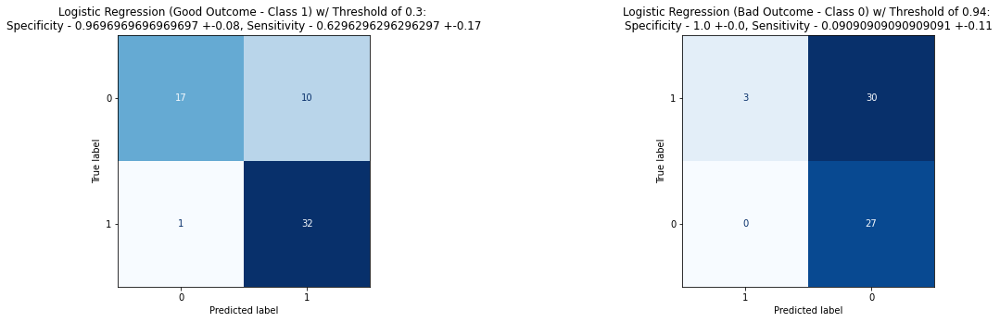

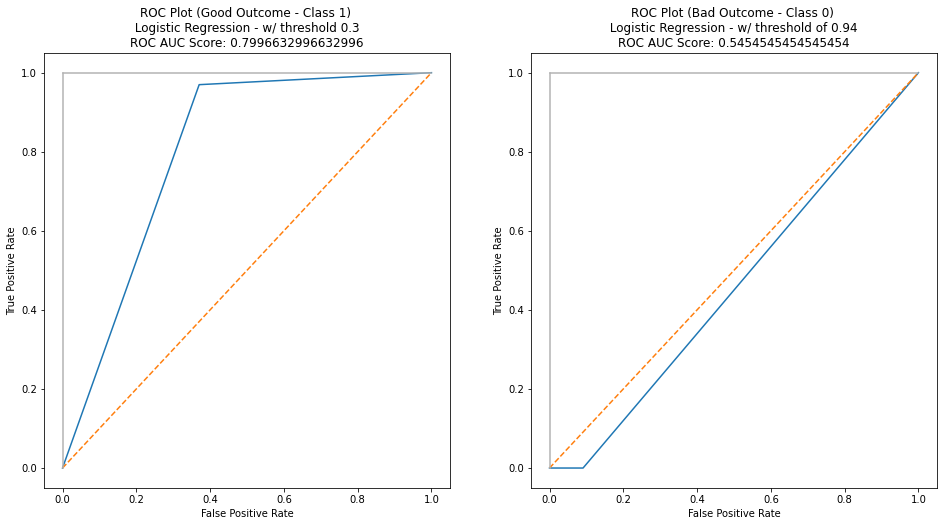


*********************************** DECISION TREE - 12 HOURS *****************************************
For decision tree:
training accuracy 0.8166666666666667
testing accuracy 0.7666666666666667
The decision tree is saved!
              precision    recall  f1-score   support

           0       0.89      0.30      0.44        27
           1       0.63      0.97      0.76        33

    accuracy                           0.67        60
   macro avg       0.76      0.63      0.60        60
weighted avg       0.75      0.67      0.62        60

              precision    recall  f1-score   support

           1       0.00      0.00      0.00        33
           0       0.45      1.00      0.62        27

    accuracy                           0.45        60
   macro avg       0.23      0.50      0.31        60
weighted avg       0.20      0.45      0.28        60



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/tmp/ipykernel_488/243264019.py:30: RuntimeWarning: invalid value e

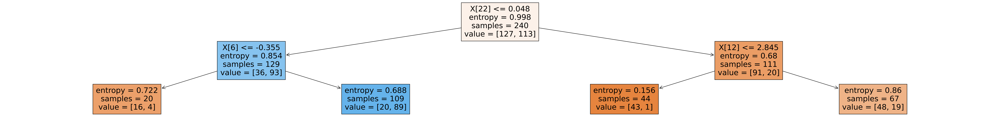

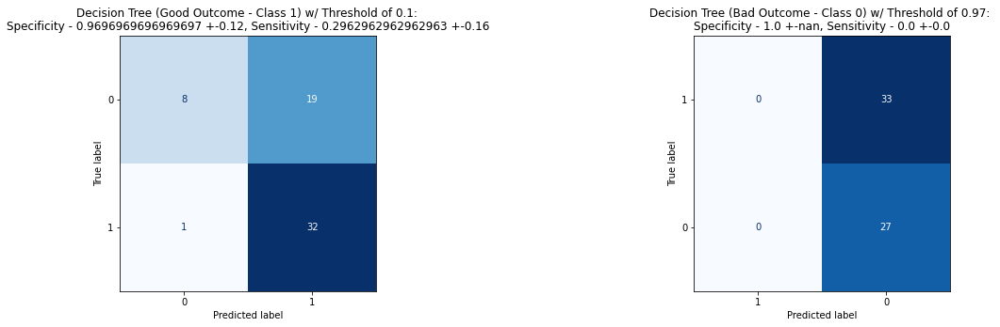

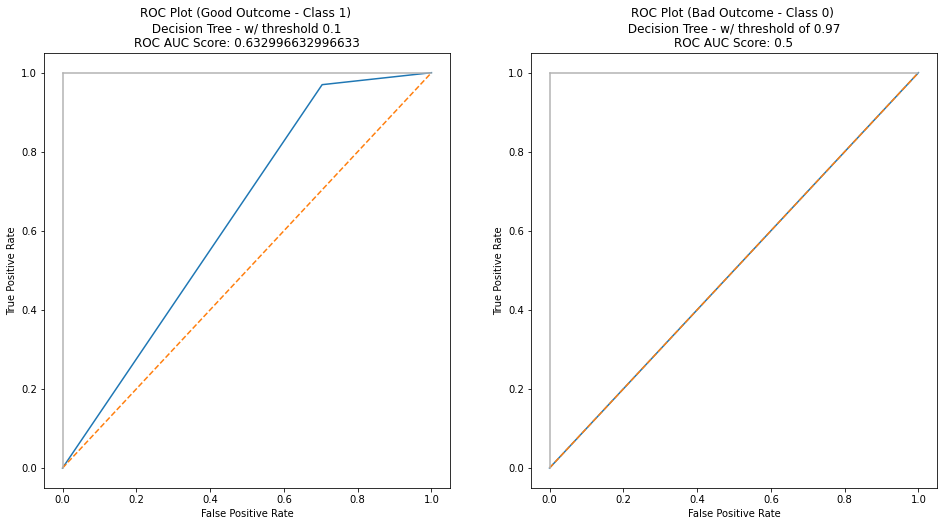


********************************** RANDOM FOREST - 12 HOURS ******************************************
For random forest:
training accuracy 0.9416666666666667
testing accuracy 0.8666666666666667
              precision    recall  f1-score   support

           0       0.93      0.48      0.63        27
           1       0.70      0.97      0.81        33

    accuracy                           0.75        60
   macro avg       0.81      0.73      0.72        60
weighted avg       0.80      0.75      0.73        60

              precision    recall  f1-score   support

           1       1.00      0.18      0.31        33
           0       0.50      1.00      0.67        27

    accuracy                           0.55        60
   macro avg       0.75      0.59      0.49        60
weighted avg       0.78      0.55      0.47        60



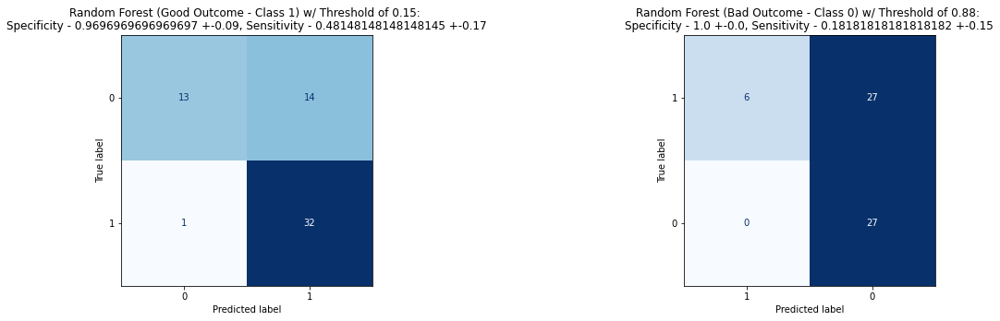

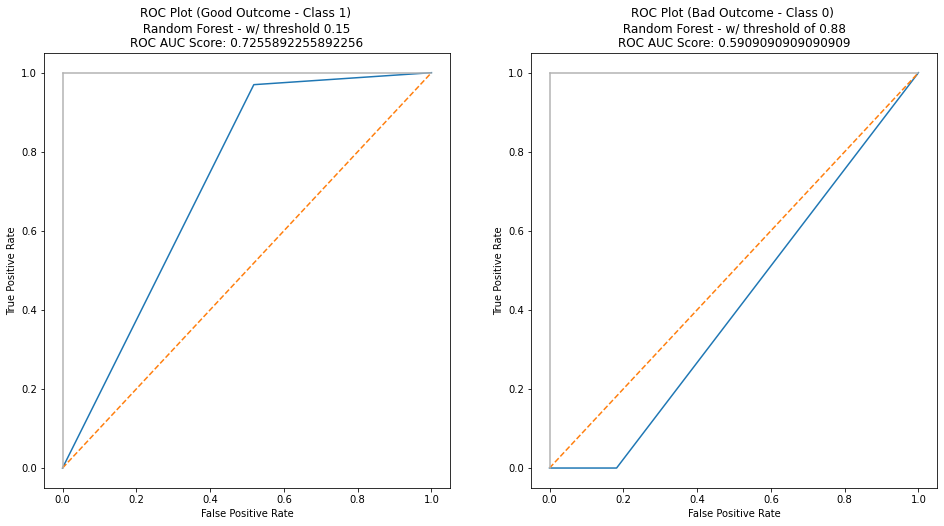


****************************** GAUSSIAN NAIVE BAYES - 12 HOURS ***************************************
For Naive Bayes:
training accuracy 0.7041666666666667
testing accuracy 0.7833333333333333
              precision    recall  f1-score   support

           0       0.88      0.52      0.65        27
           1       0.70      0.94      0.81        33

    accuracy                           0.75        60
   macro avg       0.79      0.73      0.73        60
weighted avg       0.78      0.75      0.74        60

              precision    recall  f1-score   support

           1       0.00      0.00      0.00        33
           0       0.45      1.00      0.62        27

    accuracy                           0.45        60
   macro avg       0.23      0.50      0.31        60
weighted avg       0.20      0.45      0.28        60



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/tmp/ipykernel_488/243264019.py:30: RuntimeWarning: invalid value e

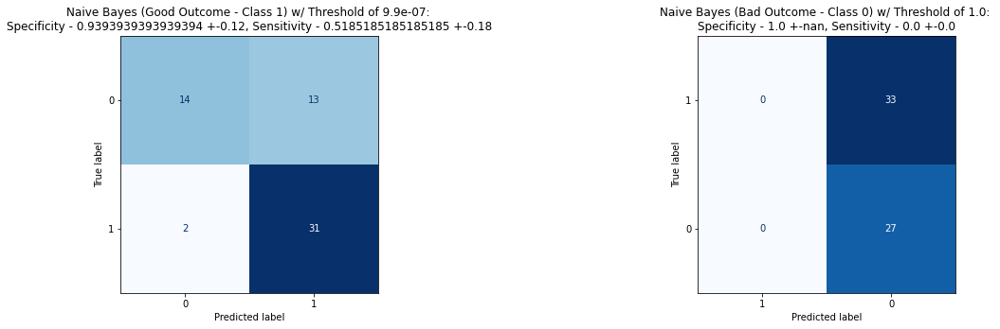

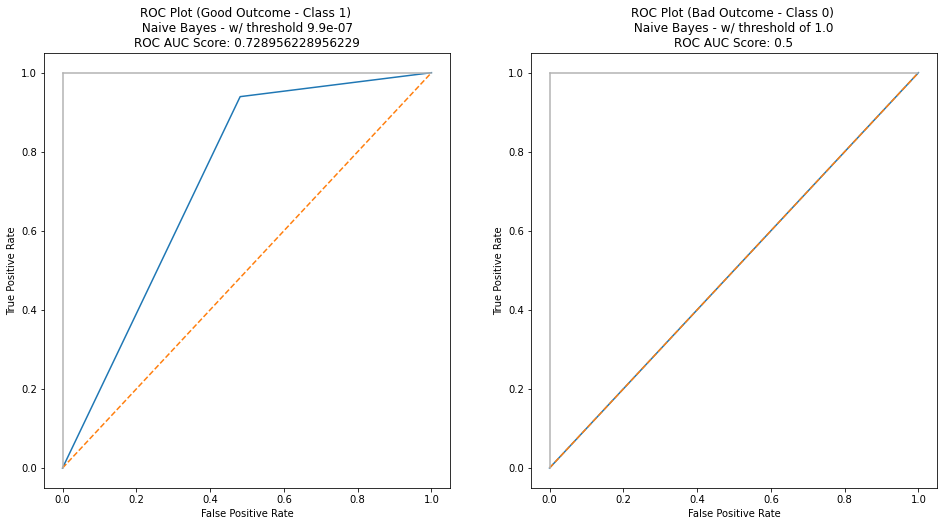


************************************** SVC - 12 HOURS ************************************************
For SVC Model:
training accuracy 0.8666666666666667
testing accuracy 0.8166666666666667
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        27
           1       0.55      1.00      0.71        33

    accuracy                           0.55        60
   macro avg       0.28      0.50      0.35        60
weighted avg       0.30      0.55      0.39        60

              precision    recall  f1-score   support

           1       0.00      0.00      0.00        33
           0       0.45      1.00      0.62        27

    accuracy                           0.45        60
   macro avg       0.23      0.50      0.31        60
weighted avg       0.20      0.45      0.28        60



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classificat

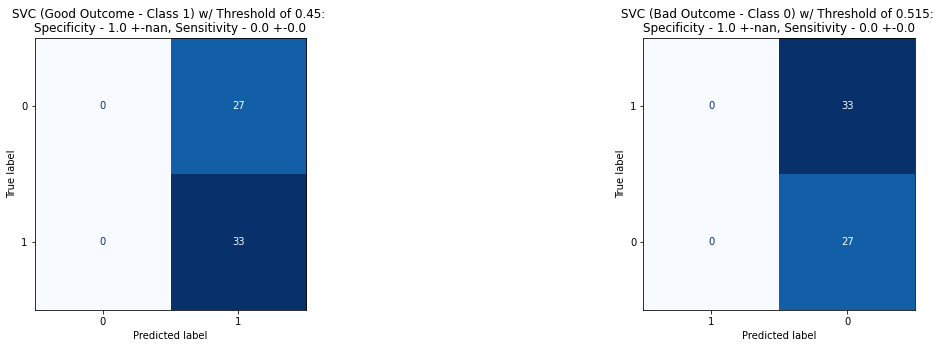

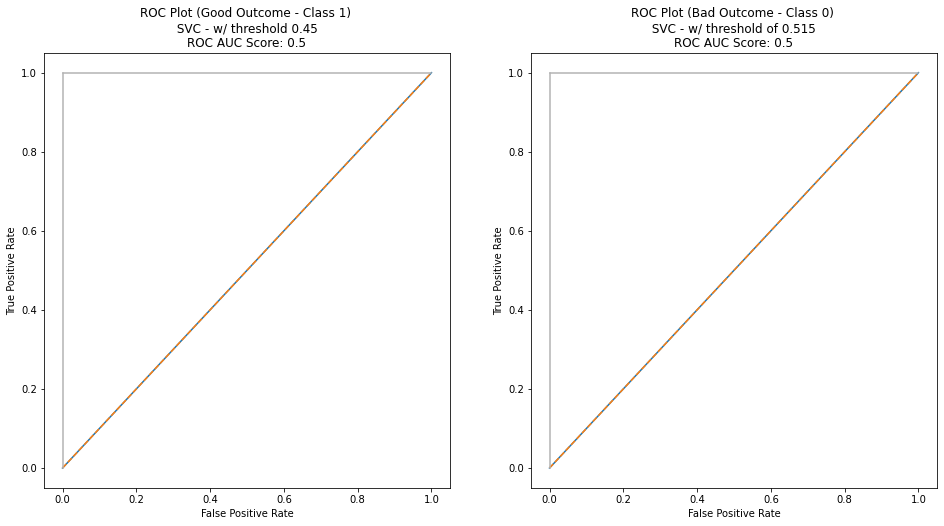

SVC(C=0.1, gamma=0.001, kernel='poly', probability=True)

In [11]:
################  LOG MODEL AND THRESHHOLD ##############
print('***************************** LOGISTIC REGRESSION - 12 HOURS *****************************************')
threshold = [0.30, 0.94]
log_reg(x_train, y_train, x_test, y_test, threshold)

print()

################# DECISION TREE MODEL AND THRESHHOLD ##############
print('*********************************** DECISION TREE - 12 HOURS *****************************************')
threshold = [0.1, 0.97]
dec_tree(x_train, y_train, x_test, y_test, threshold)

print()

################# RANDOM FOREST MODEL AND THRESHHOLD ##############
print('********************************** RANDOM FOREST - 12 HOURS ******************************************')
threshold = [0.15, 0.88]
random_forest(x_train, y_train, x_test, y_test, threshold)

print()

################# NAIVE BAYES MODEL AND THRESHHOLD ##############
print('****************************** GAUSSIAN NAIVE BAYES - 12 HOURS ***************************************')
threshold = [99e-8, 1.0-1e-20]
naive_bayes(x_train, y_train, x_test, y_test, threshold)

print()

################# SVC MODEL AND THRESHHOLD ##############
print('************************************** SVC - 12 HOURS ************************************************')
threshold = [0.45, 0.515]
svc_model(x_train, y_train, x_test, y_test, threshold)

#### Using 24 hours dataset

In [12]:
x_train, x_test, y_train, y_test = train_test_split(x_24, y_24, train_size=0.8, test_size=0.2, random_state=15)

In [13]:
loadParams(x_train, y_train, '24hr')

***************************** LOGISTIC REGRESSION - 24 HOURS *****************************************
For logistic regression:
training accuracy 0.8208333333333333
testing accuracy 0.8333333333333334
              precision    recall  f1-score   support

           0       0.91      0.37      0.53        27
           1       0.65      0.97      0.78        33

    accuracy                           0.70        60
   macro avg       0.78      0.67      0.65        60
weighted avg       0.77      0.70      0.67        60

              precision    recall  f1-score   support

           1       1.00      0.24      0.39        33
           0       0.52      1.00      0.68        27

    accuracy                           0.58        60
   macro avg       0.76      0.62      0.54        60
weighted avg       0.78      0.58      0.52        60



/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


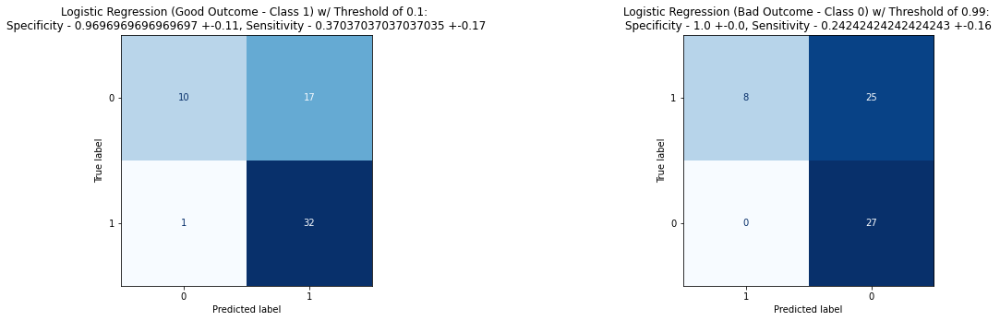

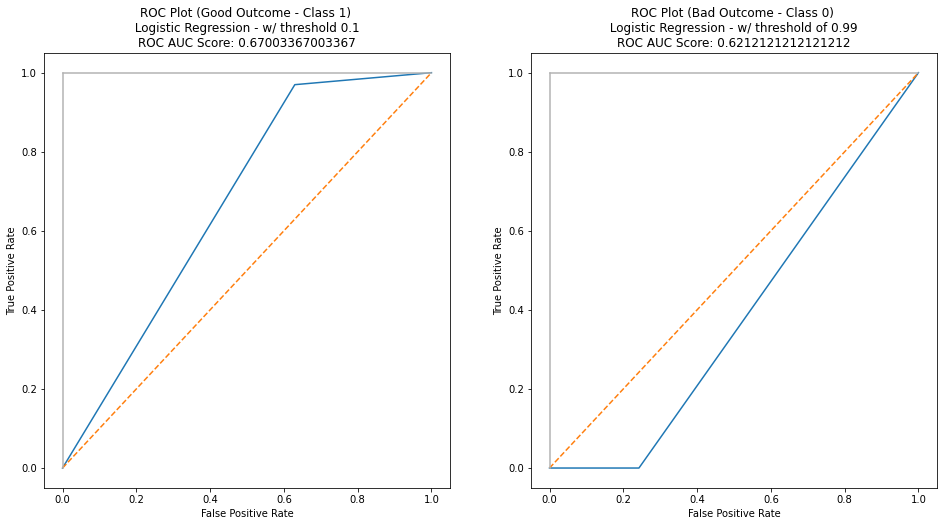


*********************************** DECISION TREE - 24 HOURS *****************************************
For decision tree:
training accuracy 0.8375
testing accuracy 0.6833333333333333
The decision tree is saved!
              precision    recall  f1-score   support

           0       0.86      0.22      0.35        27
           1       0.60      0.97      0.74        33

    accuracy                           0.63        60
   macro avg       0.73      0.60      0.55        60
weighted avg       0.72      0.63      0.57        60

              precision    recall  f1-score   support

           1       0.00      0.00      0.00        33
           0       0.45      1.00      0.62        27

    accuracy                           0.45        60
   macro avg       0.23      0.50      0.31        60
weighted avg       0.20      0.45      0.28        60



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/tmp/ipykernel_488/243264019.py:30: RuntimeWarning: invalid value e

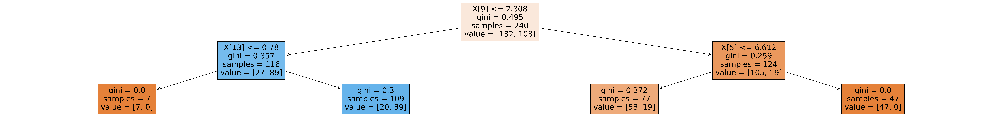

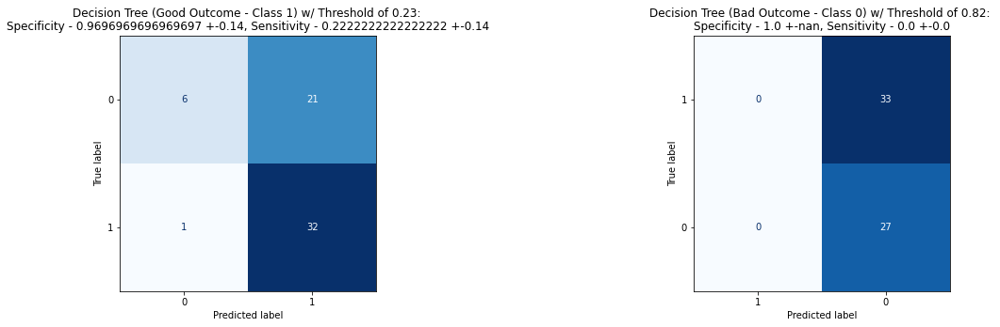

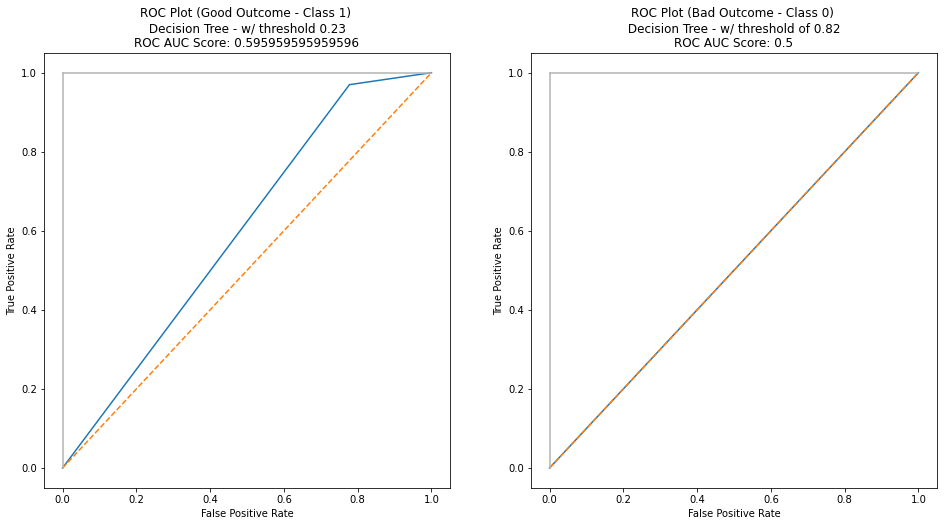


********************************** RANDOM FOREST - 24 HOURS ******************************************
For random forest:
training accuracy 0.875
testing accuracy 0.7333333333333333
              precision    recall  f1-score   support

           0       1.00      0.22      0.36        27
           1       0.61      1.00      0.76        33

    accuracy                           0.65        60
   macro avg       0.81      0.61      0.56        60
weighted avg       0.79      0.65      0.58        60

              precision    recall  f1-score   support

           1       1.00      0.06      0.11        33
           0       0.47      1.00      0.64        27

    accuracy                           0.48        60
   macro avg       0.73      0.53      0.37        60
weighted avg       0.76      0.48      0.35        60



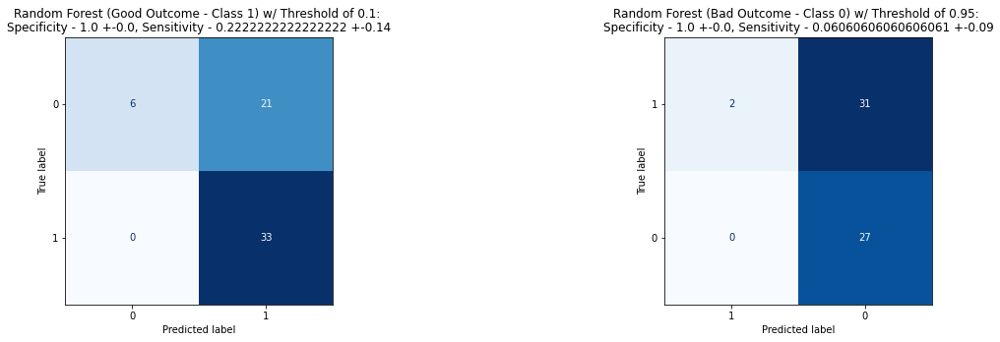

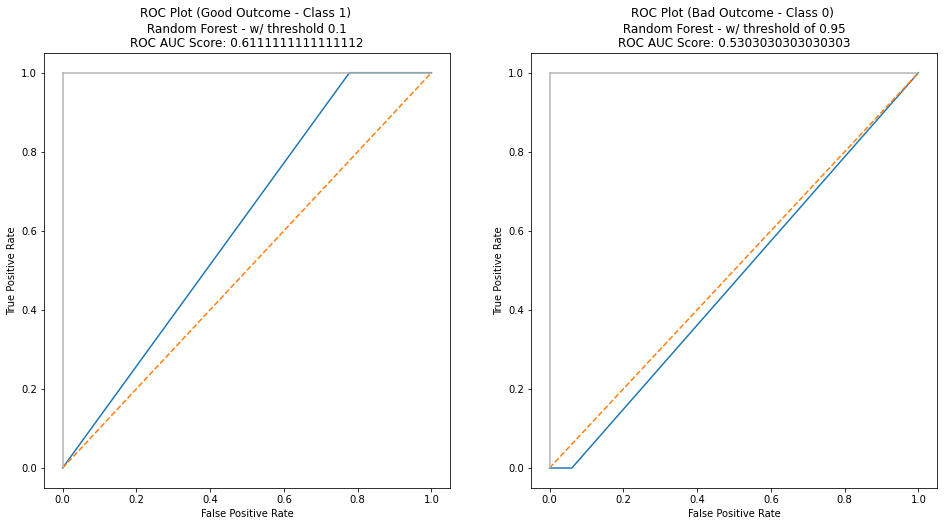


****************************** GAUSSIAN NAIVE BAYES - 24 HOURS ***************************************
For Naive Bayes:
training accuracy 0.7708333333333334
testing accuracy 0.7166666666666667
              precision    recall  f1-score   support

           0       0.92      0.44      0.60        27
           1       0.68      0.97      0.80        33

    accuracy                           0.73        60
   macro avg       0.80      0.71      0.70        60
weighted avg       0.79      0.73      0.71        60

              precision    recall  f1-score   support

           1       0.00      0.00      0.00        33
           0       0.45      1.00      0.62        27

    accuracy                           0.45        60
   macro avg       0.23      0.50      0.31        60
weighted avg       0.20      0.45      0.28        60



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/tmp/ipykernel_488/243264019.py:30: RuntimeWarning: invalid value e

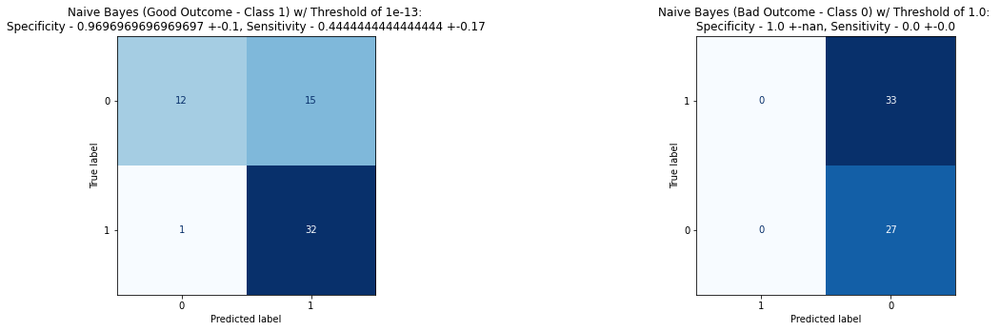

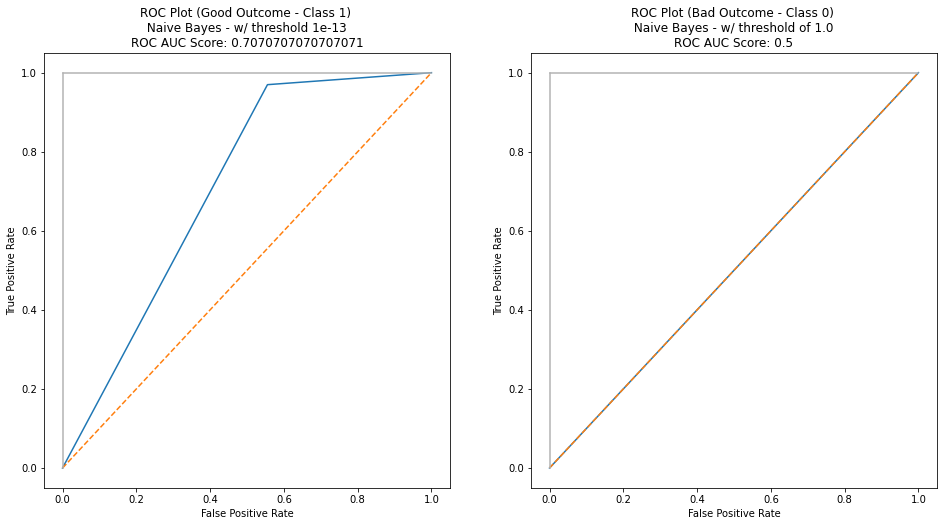


************************************** SVC - 24 HOURS ************************************************
For SVC Model:
training accuracy 0.8458333333333333
testing accuracy 0.7666666666666667
              precision    recall  f1-score   support

           0       1.00      0.22      0.36        27
           1       0.61      1.00      0.76        33

    accuracy                           0.65        60
   macro avg       0.81      0.61      0.56        60
weighted avg       0.79      0.65      0.58        60

              precision    recall  f1-score   support

           1       1.00      0.03      0.06        33
           0       0.46      1.00      0.63        27

    accuracy                           0.47        60
   macro avg       0.73      0.52      0.34        60
weighted avg       0.76      0.47      0.31        60



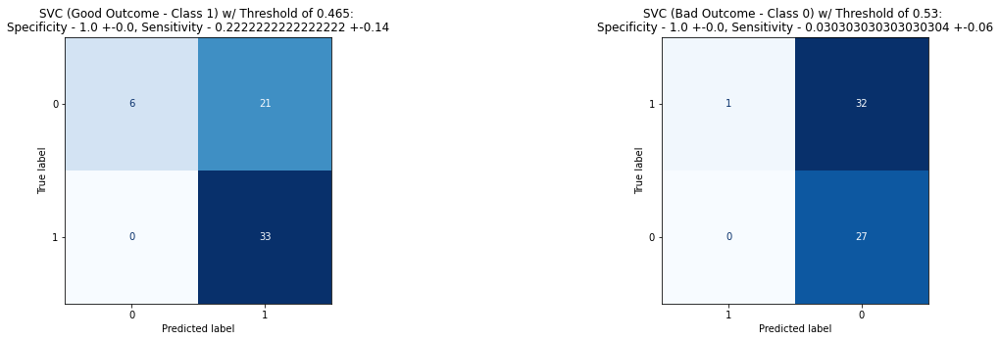

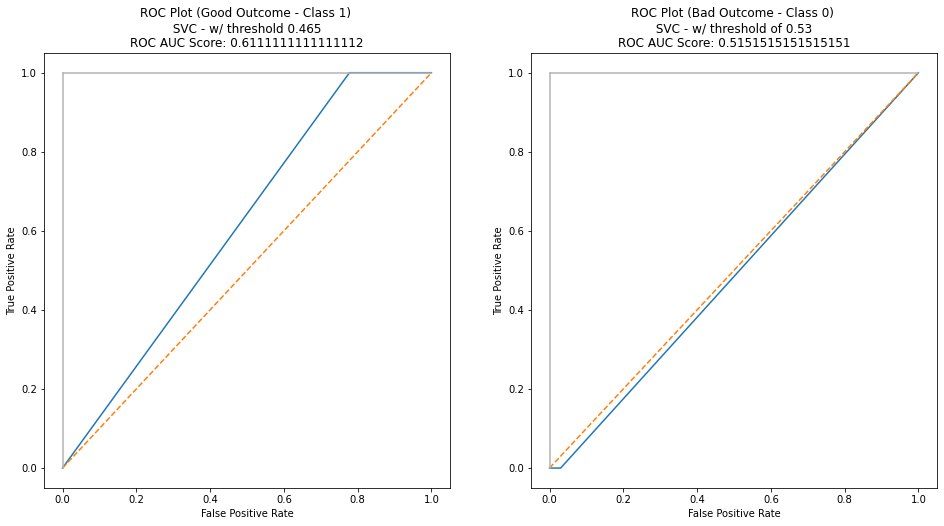

SVC(C=0.01, gamma=0.001, kernel='poly', probability=True)

In [14]:
################  LOG MODEL AND THRESHHOLD ##############
print('***************************** LOGISTIC REGRESSION - 24 HOURS *****************************************')
threshold = [0.1, 0.99]
log_reg(x_train, y_train, x_test, y_test, threshold)

print()

################# DECISION TREE MODEL AND THRESHHOLD ##############
print('*********************************** DECISION TREE - 24 HOURS *****************************************')
threshold = [0.23, 0.82]
dec_tree(x_train, y_train, x_test, y_test, threshold)

print()

################# RANDOM FOREST MODEL AND THRESHHOLD ##############
print('********************************** RANDOM FOREST - 24 HOURS ******************************************')
threshold = [0.1, 0.95]
random_forest(x_train, y_train, x_test, y_test, threshold)

print()

################# NAIVE BAYES MODEL AND THRESHHOLD ##############
print('****************************** GAUSSIAN NAIVE BAYES - 24 HOURS ***************************************')
threshold = [1e-13, 1.0-1e-20]
naive_bayes(x_train, y_train, x_test, y_test, threshold)

print()

################# SVC MODEL AND THRESHHOLD ##############
print('************************************** SVC - 24 HOURS ************************************************')
threshold = [0.465, 0.53]
svc_model(x_train, y_train, x_test, y_test, threshold)

#### Using combination of 24h data and 12h data

In [15]:
x_merged = pd.concat([x_12, x_24], axis=0)
y_merged = pd.concat([y_12, y_24], axis=0)

In [16]:
x_train, x_test, y_train, y_test = train_test_split(x_merged, y_merged, train_size=0.8, test_size=0.2, random_state=15)

In [17]:
loadParams(x_train, y_train, 'merged')

***************************** LOGISTIC REGRESSION - MERGED DATA *****************************************
For logistic regression:
training accuracy 0.85
testing accuracy 0.75
              precision    recall  f1-score   support

           0       0.95      0.62      0.75        63
           1       0.70      0.96      0.81        57

    accuracy                           0.78       120
   macro avg       0.82      0.79      0.78       120
weighted avg       0.83      0.78      0.78       120

              precision    recall  f1-score   support

           1       1.00      0.12      0.22        57
           0       0.56      1.00      0.72        63

    accuracy                           0.58       120
   macro avg       0.78      0.56      0.47       120
weighted avg       0.77      0.58      0.48       120



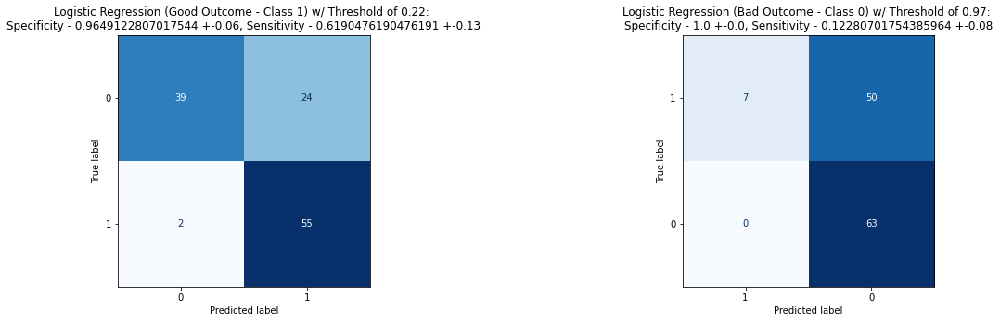

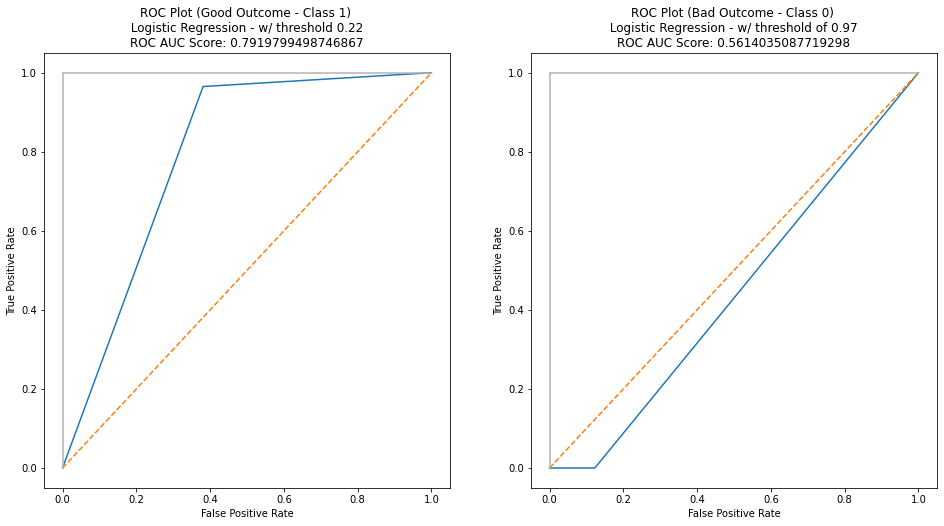


*********************************** DECISION TREE - MERGED DATA *****************************************
For decision tree:
training accuracy 0.8770833333333333
testing accuracy 0.7
The decision tree is saved!
              precision    recall  f1-score   support

           0       0.69      0.14      0.24        63
           1       0.50      0.93      0.65        57

    accuracy                           0.52       120
   macro avg       0.59      0.54      0.44       120
weighted avg       0.60      0.52      0.43       120

              precision    recall  f1-score   support

           1       0.50      0.02      0.03        57
           0       0.53      0.98      0.69        63

    accuracy                           0.53       120
   macro avg       0.51      0.50      0.36       120
weighted avg       0.51      0.53      0.38       120



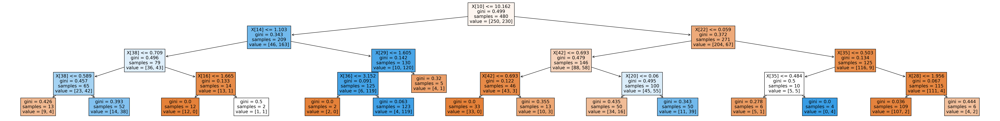

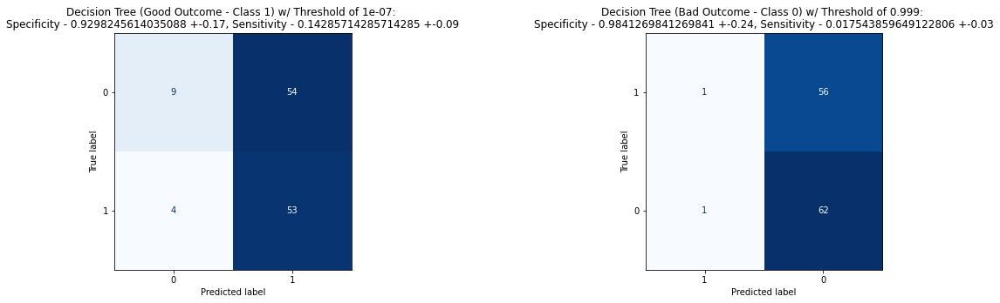

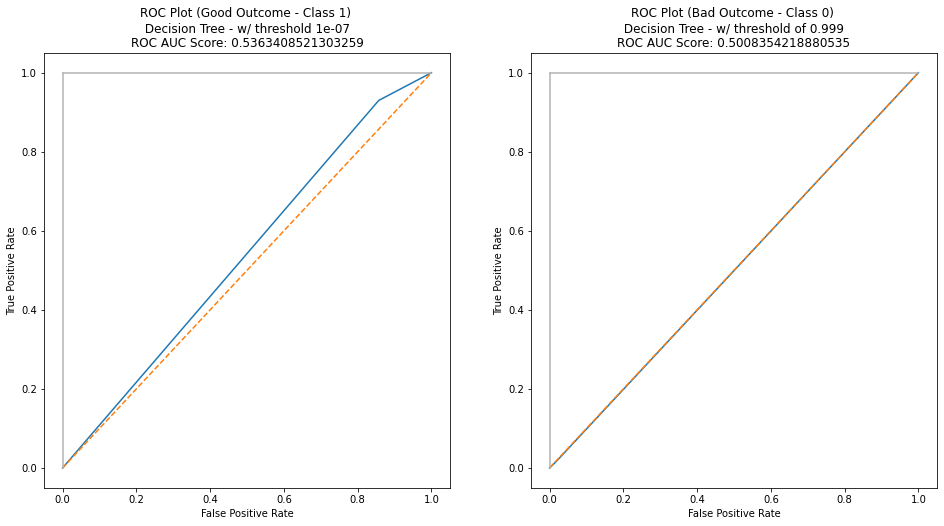


********************************** RANDOM FOREST - MERGED DATA ******************************************
For random forest:
training accuracy 0.9729166666666667
testing accuracy 0.725
              precision    recall  f1-score   support

           0       0.90      0.44      0.60        63
           1       0.61      0.95      0.74        57

    accuracy                           0.68       120
   macro avg       0.75      0.70      0.67       120
weighted avg       0.76      0.68      0.66       120

              precision    recall  f1-score   support

           1       1.00      0.07      0.13        57
           0       0.54      1.00      0.70        63

    accuracy                           0.56       120
   macro avg       0.77      0.54      0.42       120
weighted avg       0.76      0.56      0.43       120



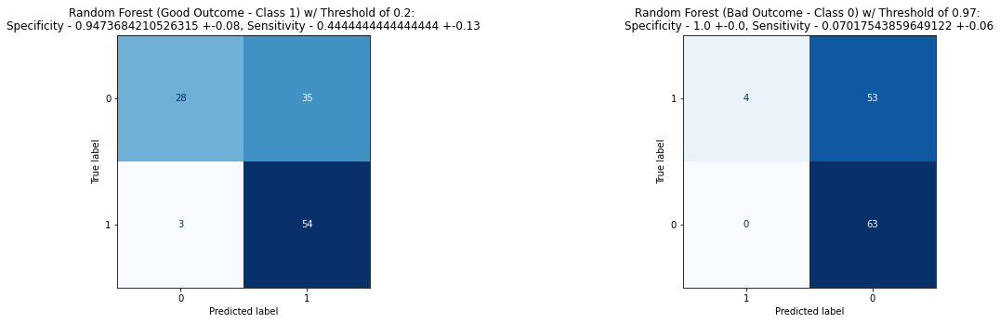

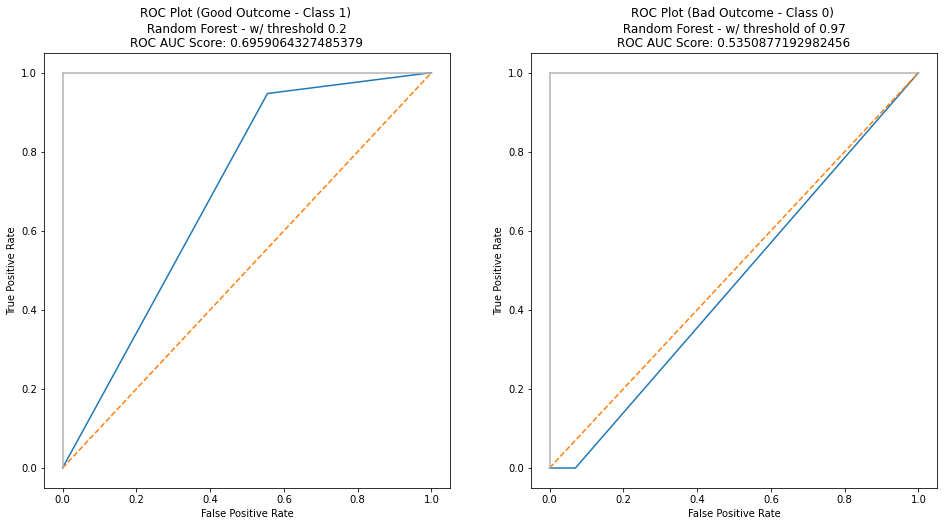


****************************** GAUSSIAN NAIVE BAYES - MERGED DATA ***************************************
For Naive Bayes:
training accuracy 0.7604166666666666
testing accuracy 0.6916666666666667
              precision    recall  f1-score   support

           0       0.96      0.35      0.51        63
           1       0.58      0.98      0.73        57

    accuracy                           0.65       120
   macro avg       0.77      0.67      0.62       120
weighted avg       0.78      0.65      0.61       120

              precision    recall  f1-score   support

           1       0.00      0.00      0.00        57
           0       0.53      1.00      0.69        63

    accuracy                           0.53       120
   macro avg       0.26      0.50      0.34       120
weighted avg       0.28      0.53      0.36       120



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/tmp/ipykernel_488/243264019.py:30: RuntimeWarning: invalid value e

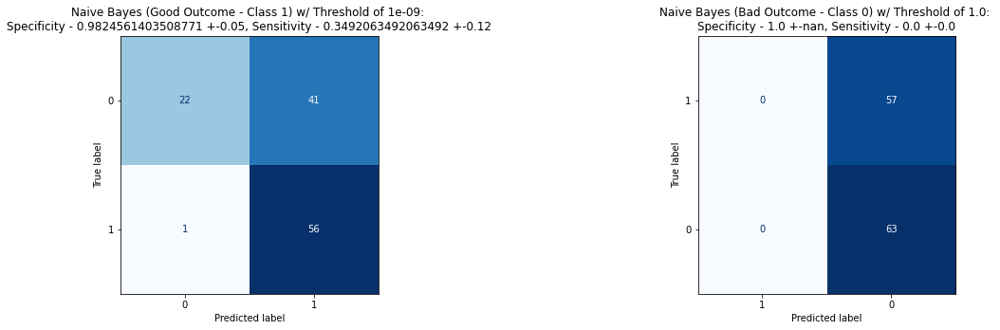

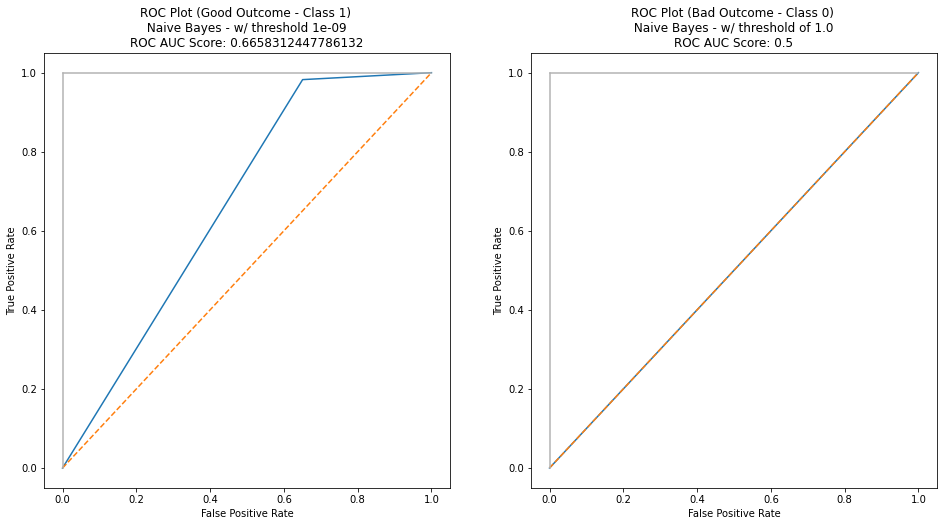


************************************** SVC - MERGED DATA ************************************************
For SVC Model:
training accuracy 0.8333333333333334
testing accuracy 0.6833333333333333
              precision    recall  f1-score   support

           0       0.89      0.13      0.22        63
           1       0.50      0.98      0.67        57

    accuracy                           0.53       120
   macro avg       0.70      0.55      0.44       120
weighted avg       0.71      0.53      0.43       120

              precision    recall  f1-score   support

           1       0.91      0.18      0.29        57
           0       0.57      0.98      0.72        63

    accuracy                           0.60       120
   macro avg       0.74      0.58      0.51       120
weighted avg       0.73      0.60      0.52       120



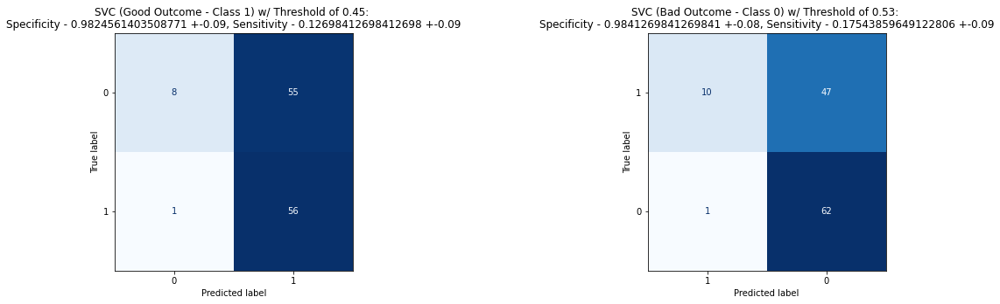

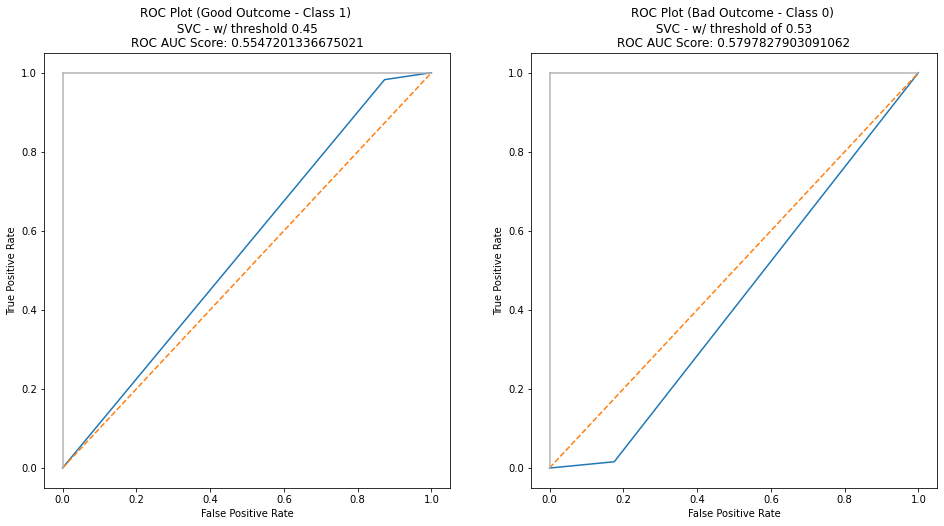

SVC(C=0.01, gamma=0.001, kernel='poly', probability=True)

In [18]:
################  LOG MODEL AND THRESHHOLD ##############
print('***************************** LOGISTIC REGRESSION - MERGED DATA *****************************************')
threshold = [0.22, 0.97]
log_reg(x_train, y_train, x_test, y_test, threshold)

print()

################# DECISION TREE MODEL AND THRESHHOLD ##############
print('*********************************** DECISION TREE - MERGED DATA *****************************************')
threshold = [1e-7, 0.999]
dec_tree(x_train, y_train, x_test, y_test, threshold)

print()

################# RANDOM FOREST MODEL AND THRESHHOLD ##############
print('********************************** RANDOM FOREST - MERGED DATA ******************************************')
threshold = [0.2, 0.97]
random_forest(x_train, y_train, x_test, y_test, threshold)

print()

################# NAIVE BAYES MODEL AND THRESHHOLD ##############
print('****************************** GAUSSIAN NAIVE BAYES - MERGED DATA ***************************************')
threshold = [1e-9, 1.0-1e-20]
naive_bayes(x_train, y_train, x_test, y_test, threshold)

print()

################# SVC MODEL AND THRESHHOLD ##############
print('************************************** SVC - MERGED DATA ************************************************')
threshold = [0.45, 0.53]
svc_model(x_train, y_train, x_test, y_test, threshold)

#### Add more features: some averages between some sets of columns

In [19]:
x_merged['EEG_AVG'] = (x_merged['delta'] + x_merged['theta'] + x_merged['alpha'] + x_merged['spindle'] + x_merged['beta'])/5
x_merged['fhtife_AVG'] = (x_merged['fhtife1'] + x_merged['fhtife2'] + x_merged['fhtife3'] + x_merged['fhtife4'])/4
x_merged['EEG_tot_AVG'] = (x_merged['delta_tot'] + x_merged['theta_tot'] + x_merged['alpha_tot'] + x_merged['spindle_tot'] + x_merged['beta_tot'])/5
x_merged['EEG_delta_AVG'] = (x_merged['alpha_delta'] + x_merged['theta_delta'] + x_merged['spindle_delta'] + x_merged['beta_delta'] + x_merged['alpha_theta'] + x_merged['spindle_theta'] + x_merged['beta_theta'])/7
x_merged

,Nonlinear energy,Activity,Mobility,Complexity,RMS Amplitude,kurtosis,skewness,meanAM,stdAM,SkewAM,...,SE,saen,abs(renyi),abs(shan),perm_entr,FD,EEG_AVG,fhtife_AVG,EEG_tot_AVG,EEG_delta_AVG
0,6.381825,29.755446,0.408301,2.897726,5.366760,5.745661,-0.498812,59.551692,101.820196,3.228611,...,0.702795,0.799193,13.427809,69.161258,0.692778,1.523232,5.112545,4.916896,0.197791,0.172814
1,8.434789,117.289335,0.517105,3.144103,7.448673,6.139682,-0.084028,234.689385,462.799923,3.093612,...,0.697865,0.916383,13.228661,66.398887,0.692703,1.655553,14.160060,5.146012,0.194152,0.534678
2,1.420924,4.314372,0.601364,2.513006,1.867036,5.966349,-0.273994,8.632826,18.834429,3.403344,...,0.739743,1.396126,12.310336,74.056516,0.692844,1.726974,0.745194,4.828856,0.200015,0.351605
3,0.081762,0.166315,0.810457,1.805010,0.406380,3.049119,-0.011966,0.332706,0.341682,1.970038,...,0.812399,1.876191,11.024560,102.255567,0.692851,1.787456,0.027508,5.200582,0.200224,0.462709
4,6.678718,49.564944,0.352367,3.353944,6.992962,3.440489,-0.322447,99.230193,113.868248,2.236528,...,0.697125,0.934298,13.846035,98.649180,0.692812,1.517652,6.329803,5.230650,0.201369,0.142680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,5.001720,40.301632,0.909967,2.324946,4.811150,7.256107,-0.138623,80.831651,182.179919,3.199029,...,0.766158,1.556960,12.619326,81.635525,0.692519,1.903106,2.548242,6.277015,0.201953,1.359277
296,42.563103,94.940855,0.539565,1.636931,9.708921,2.931331,-0.032372,189.996419,184.638270,1.870766,...,0.724091,1.116013,14.204583,105.101515,0.692716,1.456587,18.262056,5.580801,0.200546,0.268317
297,17.702077,112.948591,0.322482,3.014937,10.494888,2.876067,-0.127506,226.074451,220.636681,1.909781,...,0.684618,0.881047,14.273665,111.806149,0.692739,1.381985,15.474104,5.951890,0.200900,0.109022
298,4.495359,45.735021,0.261880,3.540015,6.675704,4.275619,-0.387913,91.537746,125.181536,2.692543,...,0.637389,0.632849,13.723192,84.366664,0.692725,1.353339,6.187825,6.823244,0.203668,0.070060


In [20]:
x_merged_train, x_merged_test, y_merged_train, y_merged_test = train_test_split(x_merged, y_merged, train_size=0.8, test_size=0.2, random_state=14)
print(x_merged_train.shape, ' ', x_merged_test.shape, ' ', y_merged_train.shape, ' ', y_merged_test.shape)

(480, 48)   (120, 48)   (480,)   (120,)


In [21]:
loadParams(x_merged_train, y_merged_train, 'merged_addition')

#### train model and print classification report

***************************** LOGISTIC REGRESSION - MERGED DATA *****************************************
For logistic regression:
training accuracy 0.8520833333333333
testing accuracy 0.8
              precision    recall  f1-score   support

           0       0.95      0.67      0.79        55
           1       0.78      0.97      0.86        65

    accuracy                           0.83       120
   macro avg       0.86      0.82      0.83       120
weighted avg       0.86      0.83      0.83       120

              precision    recall  f1-score   support

           1       1.00      0.09      0.17        65
           0       0.48      1.00      0.65        55

    accuracy                           0.51       120
   macro avg       0.74      0.55      0.41       120
weighted avg       0.76      0.51      0.39       120



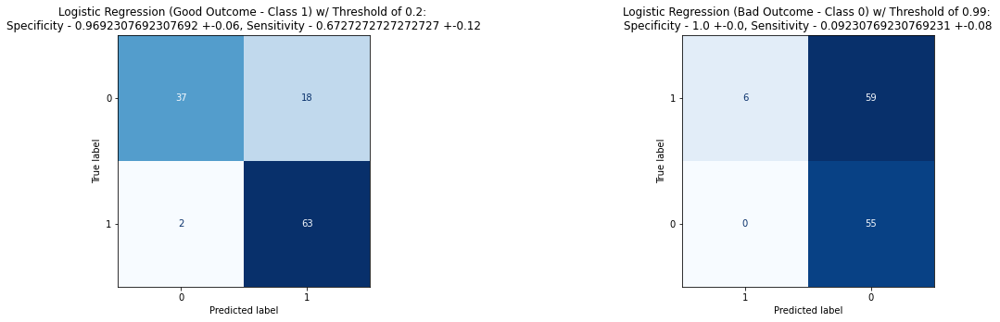

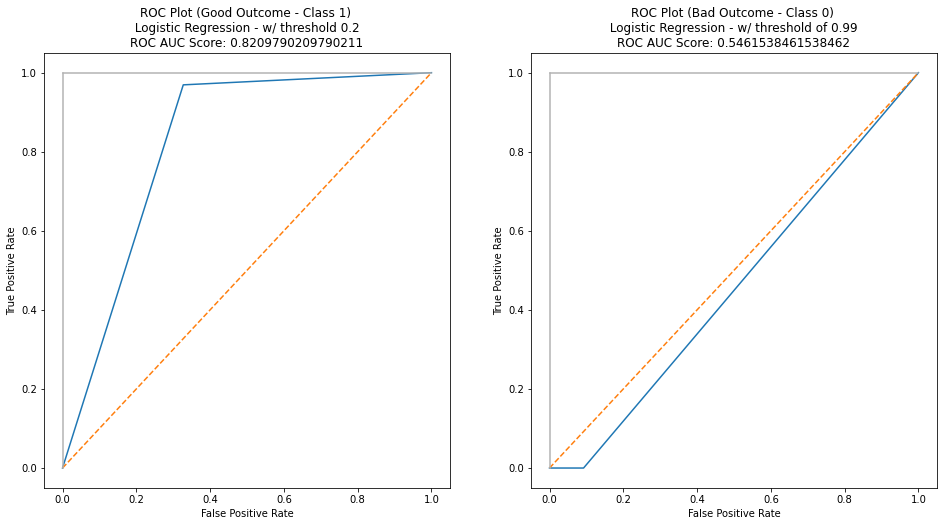


*********************************** DECISION TREE - MERGED DATA *****************************************
For decision tree:
training accuracy 0.8875
testing accuracy 0.775
The decision tree is saved!
              precision    recall  f1-score   support

           0       0.80      0.67      0.73        55
           1       0.76      0.86      0.81        65

    accuracy                           0.78       120
   macro avg       0.78      0.77      0.77       120
weighted avg       0.78      0.78      0.77       120

              precision    recall  f1-score   support

           1       0.81      0.65      0.72        65
           0       0.66      0.82      0.73        55

    accuracy                           0.73       120
   macro avg       0.73      0.73      0.72       120
weighted avg       0.74      0.72      0.72       120



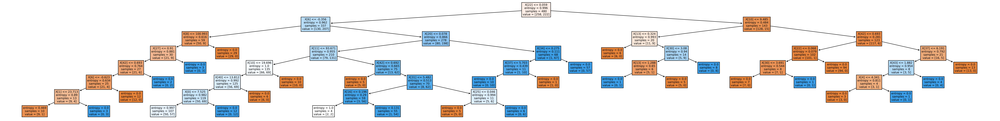

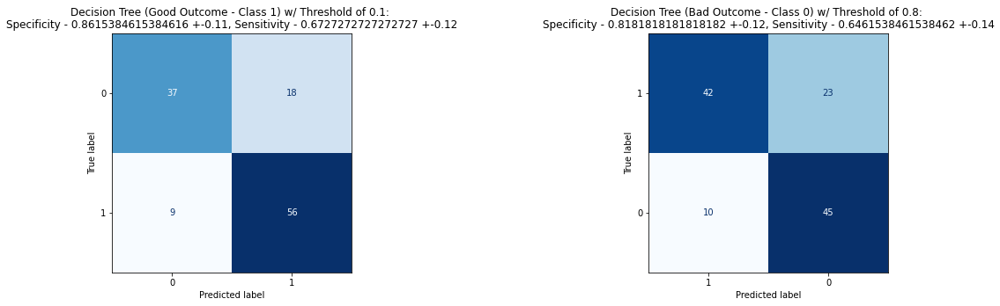

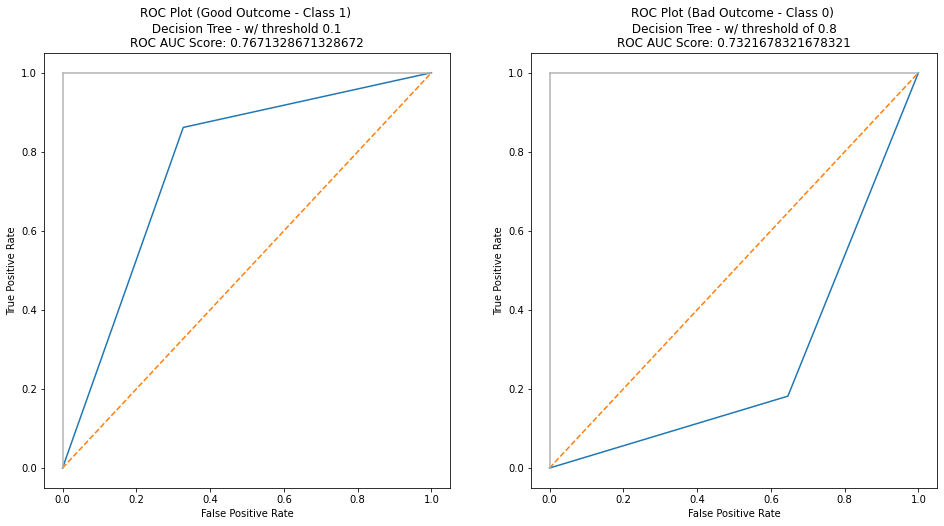


********************************** RANDOM FOREST - MERGED DATA ******************************************
For random forest:
training accuracy 0.89375
testing accuracy 0.8166666666666667
              precision    recall  f1-score   support

           0       1.00      0.29      0.45        55
           1       0.62      1.00      0.77        65

    accuracy                           0.68       120
   macro avg       0.81      0.65      0.61       120
weighted avg       0.80      0.68      0.62       120

              precision    recall  f1-score   support

           1       1.00      0.38      0.56        65
           0       0.58      1.00      0.73        55

    accuracy                           0.67       120
   macro avg       0.79      0.69      0.64       120
weighted avg       0.81      0.67      0.64       120



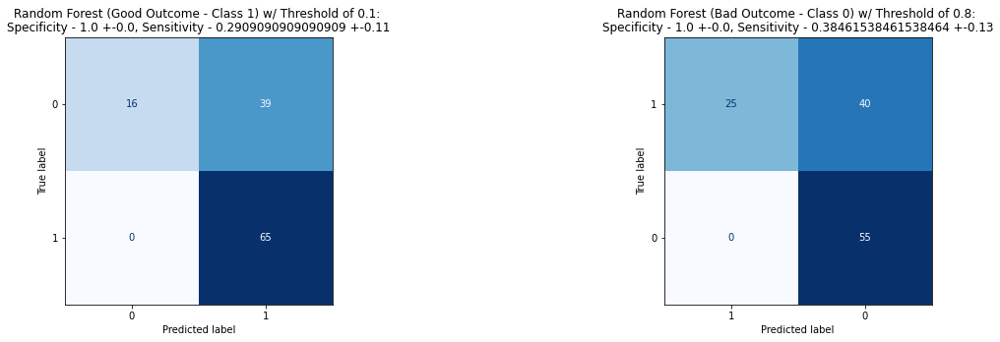

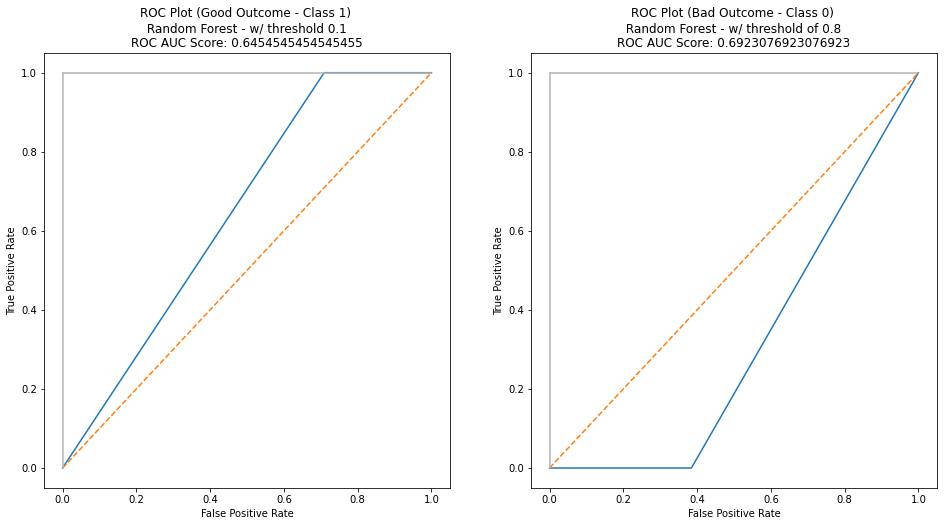


****************************** GAUSSIAN NAIVE BAYES - MERGED DATA ***************************************
For Naive Bayes:
training accuracy 0.7375
testing accuracy 0.775
              precision    recall  f1-score   support

           0       0.91      0.38      0.54        55
           1       0.65      0.97      0.78        65

    accuracy                           0.70       120
   macro avg       0.78      0.68      0.66       120
weighted avg       0.77      0.70      0.67       120

              precision    recall  f1-score   support

           1       1.00      0.09      0.17        65
           0       0.48      1.00      0.65        55

    accuracy                           0.51       120
   macro avg       0.74      0.55      0.41       120
weighted avg       0.76      0.51      0.39       120



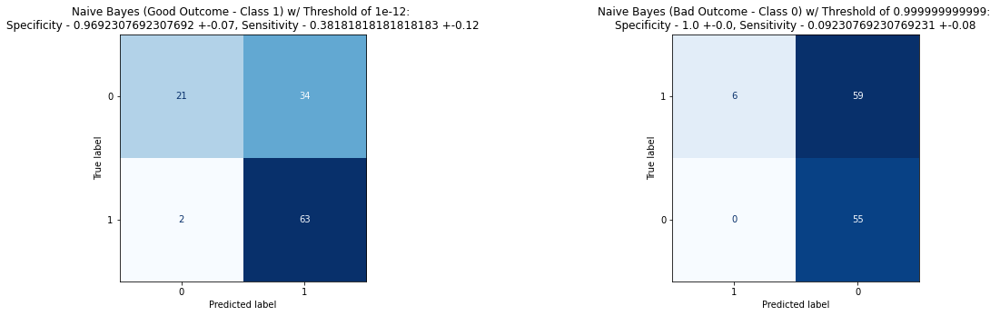

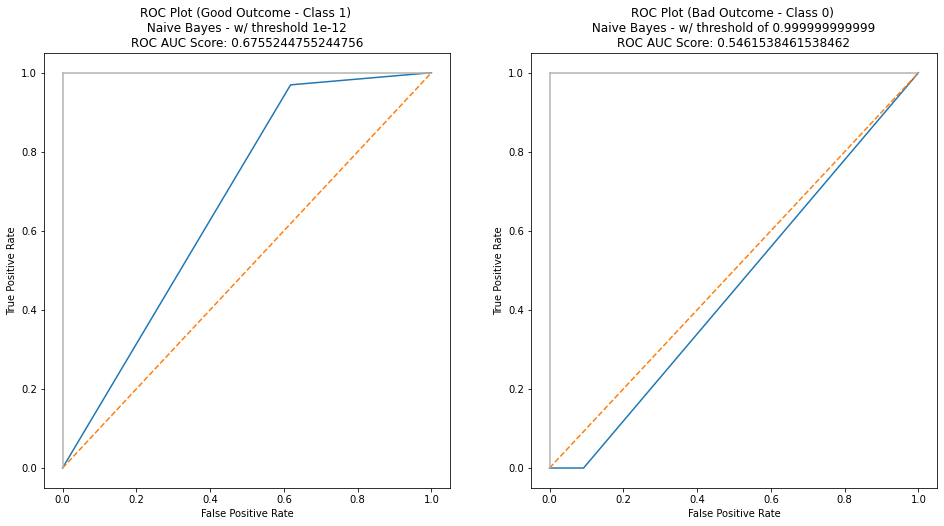


************************************** SVC - MERGED DATA ************************************************
For SVC Model:
training accuracy 0.8125
testing accuracy 0.85
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        55
           1       0.54      1.00      0.70        65

    accuracy                           0.54       120
   macro avg       0.27      0.50      0.35       120
weighted avg       0.29      0.54      0.38       120

              precision    recall  f1-score   support

           1       1.00      0.15      0.27        65
           0       0.50      1.00      0.67        55

    accuracy                           0.54       120
   macro avg       0.75      0.58      0.47       120
weighted avg       0.77      0.54      0.45       120



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/tmp/ipykernel_488/243264019.py:30: RuntimeWarning: invalid value e

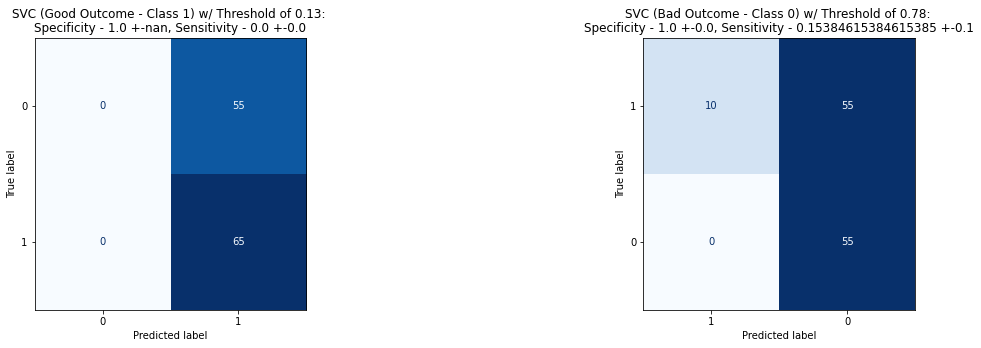

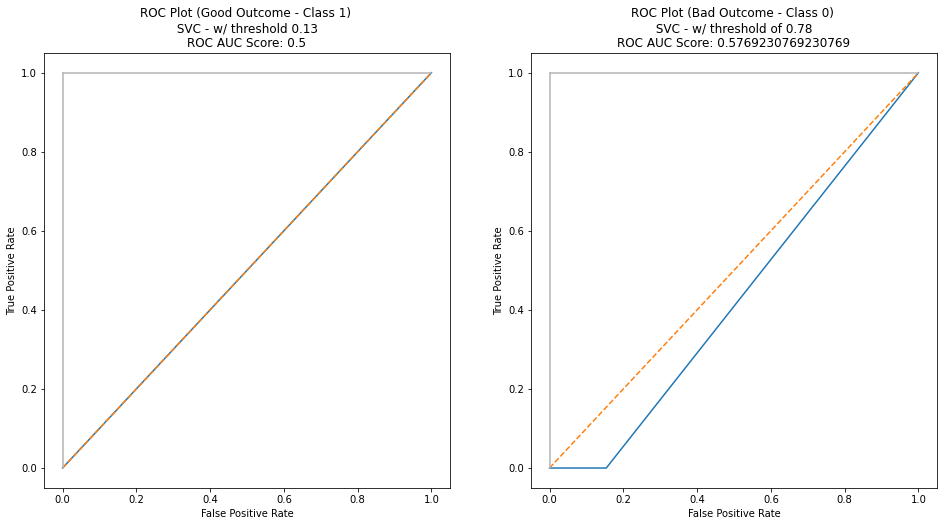

SVC(C=1, gamma=0.001, probability=True)

In [22]:
################  LOG MODEL AND THRESHHOLD ##############
print('***************************** LOGISTIC REGRESSION - MERGED DATA *****************************************')
threshold = [0.2, 0.99]
log_reg(x_merged_train, y_merged_train, x_merged_test, y_merged_test, threshold)

print()

################# DECISION TREE MODEL AND THRESHHOLD ##############
print('*********************************** DECISION TREE - MERGED DATA *****************************************')
threshold = [0.1, 0.8]
dec_tree(x_merged_train, y_merged_train, x_merged_test, y_merged_test, threshold)

print()

################# RANDOM FOREST MODEL AND THRESHHOLD ##############
print('********************************** RANDOM FOREST - MERGED DATA ******************************************')
threshold = [0.10, 0.8]
random_forest(x_merged_train, y_merged_train, x_merged_test, y_merged_test, threshold)

print()

################# NAIVE BAYES MODEL AND THRESHHOLD ##############
print('****************************** GAUSSIAN NAIVE BAYES - MERGED DATA ***************************************')
threshold = [1e-12, 1.0-1e-12]
naive_bayes(x_merged_train, y_merged_train, x_merged_test, y_merged_test, threshold)

print()

################# SVC MODEL AND THRESHHOLD ##############
print('************************************** SVC - MERGED DATA ************************************************')
threshold = [0.13, 0.78]
svc_model(x_merged_train, y_merged_train, x_merged_test, y_merged_test, threshold)

# Determining feature importance
Attempt at determining feature importance and skewness through the use of box plots and feature selection (forward and backward) feature elimination.

## Box Plots of Data

Box Plots of 12 Hours Data:


,Patient Outcome,Nonlinear energy,Activity,Mobility,Complexity,RMS Amplitude,kurtosis,skewness,meanAM,stdAM,...,sef,df,svd_ent,H_spec,SE,saen,abs(renyi),abs(shan),perm_entr,FD
0,0.0,0.017957,0.034268,0.233655,0.246562,0.174811,0.083675,0.733911,0.034273,0.020267,...,0.024371,0.013578,0.629615,0.568424,0.607668,0.344164,0.638090,0.065176,0.936248,0.381779
1,0.0,0.023808,0.135643,0.324254,0.281228,0.247914,0.094124,0.806183,0.135634,0.092360,...,0.024371,0.042599,0.580351,0.559796,0.595614,0.406095,0.587147,0.060878,0.912564,0.530072
2,0.0,0.003817,0.004804,0.394416,0.192431,0.051924,0.089528,0.773083,0.004804,0.003693,...,0.030660,0.047657,0.754742,0.674086,0.698016,0.659624,0.352233,0.072793,0.957128,0.610114
3,0.0,0.000000,0.000000,0.568526,0.092815,0.000636,0.012162,0.818739,0.000000,0.000000,...,0.056604,0.036475,0.915464,0.858802,0.875681,0.913324,0.023324,0.116672,0.959362,0.677897
4,1.0,0.018803,0.057210,0.187080,0.310753,0.231912,0.022542,0.764641,0.057237,0.022673,...,0.018082,0.006257,0.560398,0.398399,0.593804,0.415563,0.745074,0.111060,0.947060,0.375526


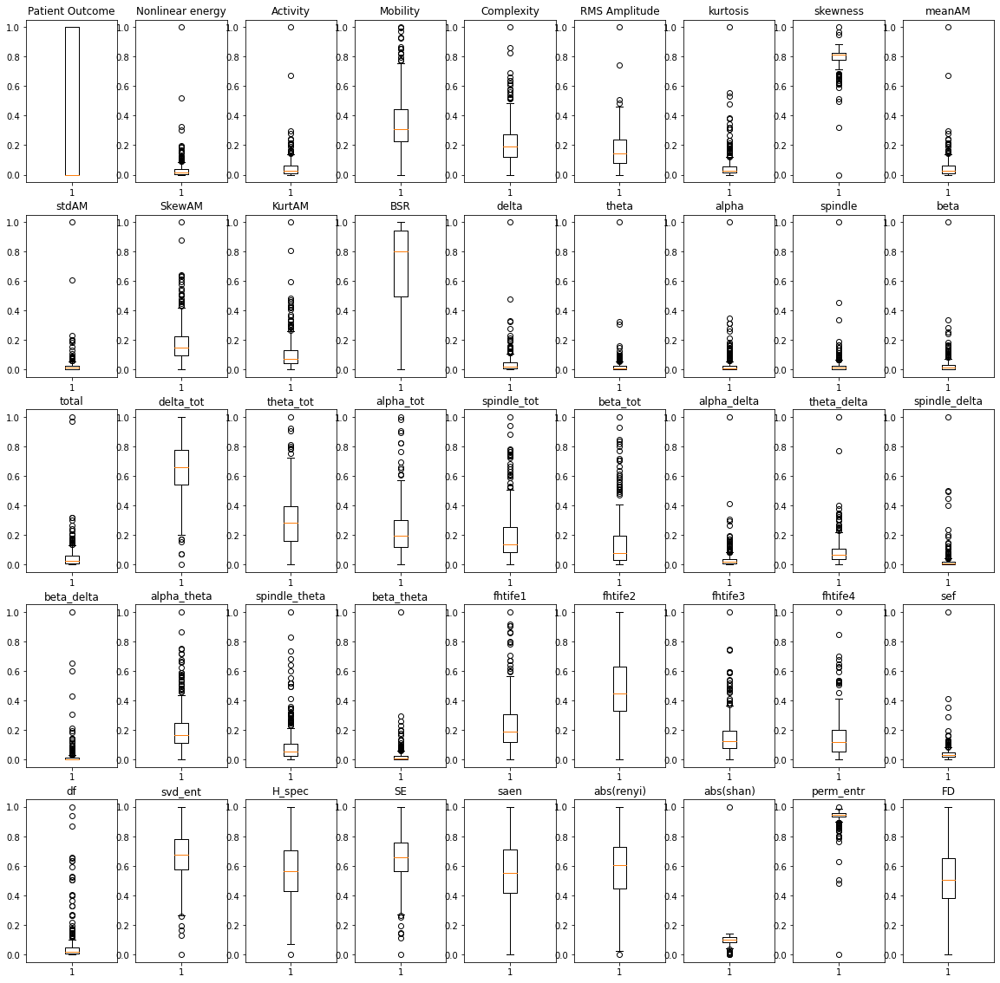

################################################################
Box Plots of 24 Hours Data:


,Patient Outcome,Nonlinear energy,Activity,Mobility,Complexity,RMS Amplitude,kurtosis,skewness,meanAM,stdAM,...,sef,df,svd_ent,H_spec,SE,saen,abs(renyi),abs(shan),perm_entr,FD
0,0.0,0.029013,0.039906,0.187011,0.390180,0.211449,0.205500,0.381920,0.039885,0.040087,...,0.161926,0.033255,0.524708,0.486679,0.422334,0.343481,0.607398,0.422885,0.989978,0.386442
1,0.0,0.056093,0.117730,0.107279,0.387693,0.384012,0.112123,0.309116,0.117658,0.087814,...,0.100656,0.013703,0.331454,0.341955,0.404505,0.168295,0.790044,0.604163,0.980249,0.163376
2,0.0,0.021222,0.059161,0.091792,0.522630,0.264982,0.048380,0.437363,0.059153,0.040112,...,0.109409,0.019719,0.324611,0.294210,0.295170,0.289072,0.716673,0.784734,0.979019,0.180952
3,1.0,0.038155,0.055941,0.193234,0.300070,0.258087,0.011892,0.479072,0.055903,0.031708,...,0.207877,0.045287,0.454267,0.482328,0.462360,0.457608,0.740997,0.910993,0.973635,0.156096
4,1.0,0.183976,0.151788,0.284108,0.154271,0.437008,0.008157,0.483821,0.151637,0.088287,...,0.540481,0.136197,0.556902,0.602278,0.480907,0.529480,0.887224,0.939341,0.977959,0.249768


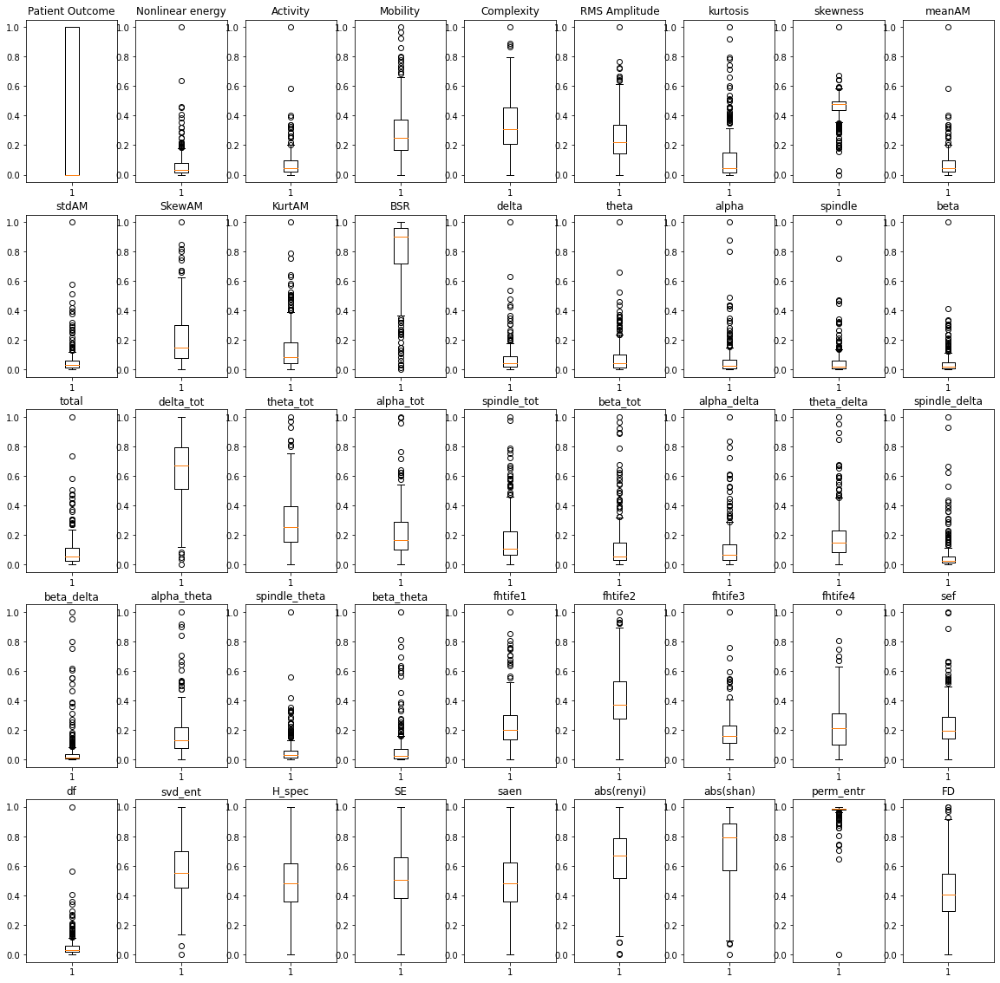

In [23]:
print('Box Plots of 12 Hours Data:')
df_12hr_normalized = (df_12hr-df_12hr.min())/(df_12hr.max()-df_12hr.min())

display(df_12hr_normalized.head())
headers = df_12hr_normalized.columns

fig7, axs = plt.subplots(5, 9, figsize=(20, 20), constrained_layout=False)

for i, ax in enumerate(axs.flat):
    ax.boxplot(df_12hr_normalized[df_12hr_normalized.columns[i]])
    ax.set_title(headers[i])

plt.savefig('boxplots_12.jpg', dpi=600)
plt.show()

print('################################################################')

print('Box Plots of 24 Hours Data:')
df_24hr_normalized = (df_24hr-df_24hr.min())/(df_24hr.max()-df_24hr.min())

display(df_24hr_normalized.head())
headers = df_24hr_normalized.columns

fig7, axs = plt.subplots(5, 9, figsize=(20, 20), constrained_layout=False)

for i, ax in enumerate(axs.flat):
    ax.boxplot(df_24hr_normalized[df_24hr_normalized.columns[i]])
    ax.set_title(headers[i])

plt.savefig('boxplots_24.jpg', dpi=600)
plt.show()

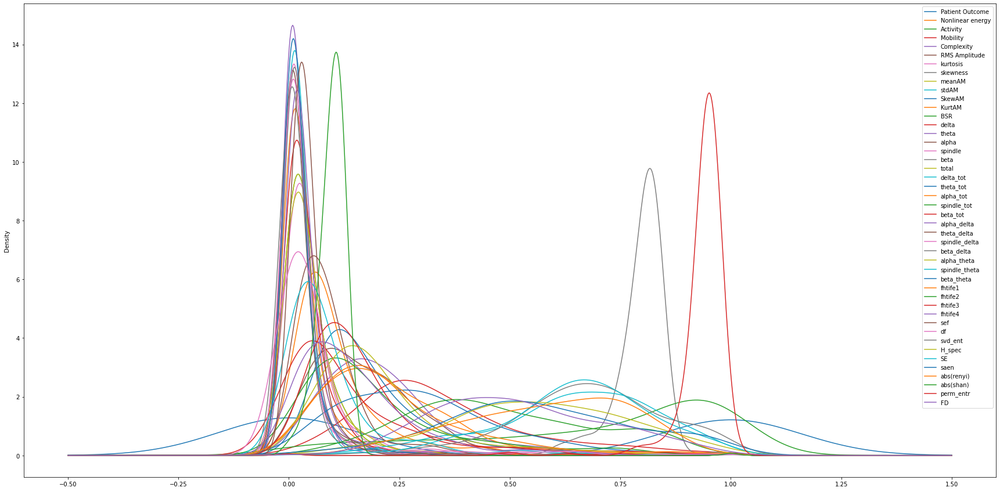

In [24]:
df_12hr_normalized.plot(kind = 'density', figsize=(30,15)).figure.savefig('densityplot.jpg')

## Backward Feature selections

In [25]:
# Define feature selection
models = {
    'log': LogisticRegression(**model_params['logistic']),
    'dec': DecisionTreeClassifier(**model_params['decision']),
    'ran': RandomForestClassifier(**model_params['random']),
    'gauss': GaussianNB(**model_params['naive']),
    'svc': SVC(**model_params['svc'])
}


def selectProperFeatures(x_train, y_train, x_test, y_test, m_type, num_feat=0.8):
    model = models[m_type].fit(x_train, y_train)
    reg_sfs = sfs(model, k_features=int(num_feat*len(x_train.columns)),
                  forward=False, verbose=0, scoring='roc_auc', n_jobs=-1)
    reg_sfs = reg_sfs.fit(x_train, y_train)
    feature = list(reg_sfs.k_feature_names_)
    x_train = x_train[feature]
    x_test = x_test[feature]
    return x_train, x_test, y_train, y_test

#### 12hr dataset

In [26]:
x_train, x_test, y_train, y_test = train_test_split(x_12, y_12, train_size=0.8, test_size=0.2, random_state=15)

In [27]:
loadParams(x_train, y_train, '12hr')

***************************** LOGISTIC REGRESSION - 12 HOURS *****************************************
For logistic regression:
training accuracy 0.7833333333333333
testing accuracy 0.7833333333333333
              precision    recall  f1-score   support

           0       0.94      0.63      0.76        27
           1       0.76      0.97      0.85        33

    accuracy                           0.82        60
   macro avg       0.85      0.80      0.80        60
weighted avg       0.84      0.82      0.81        60

              precision    recall  f1-score   support

           1       1.00      0.06      0.11        33
           0       0.47      1.00      0.64        27

    accuracy                           0.48        60
   macro avg       0.73      0.53      0.37        60
weighted avg       0.76      0.48      0.35        60



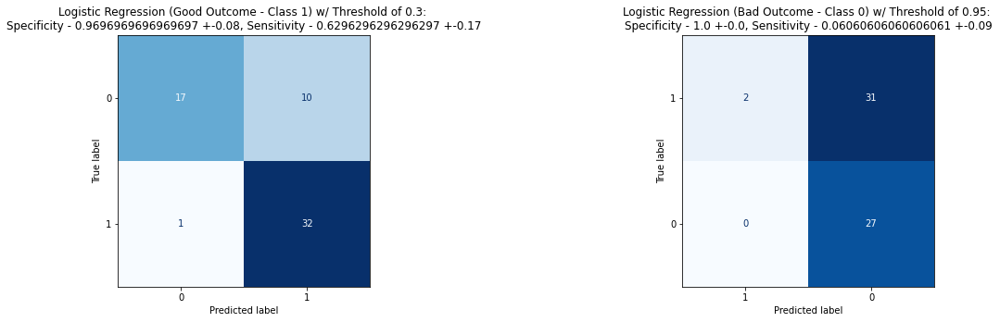

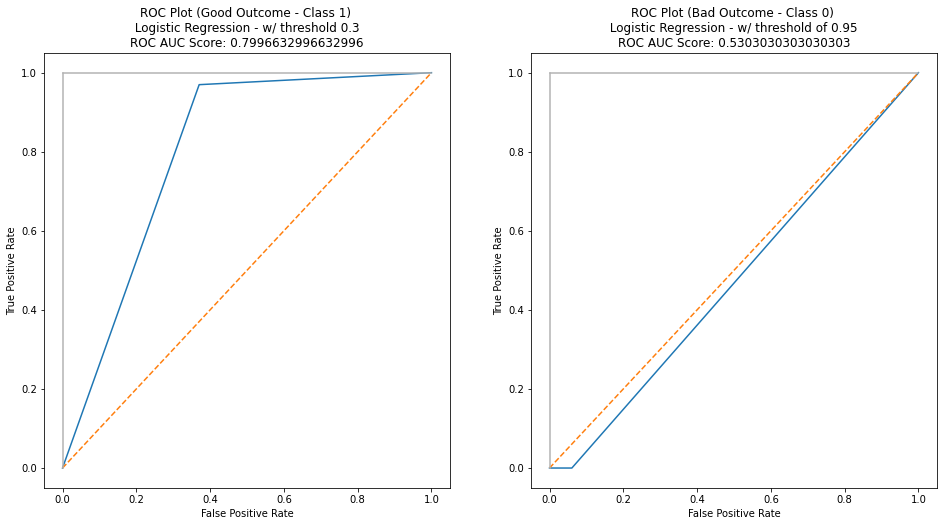


*********************************** DECISION TREE - 12 HOURS *****************************************
For decision tree:
training accuracy 0.7625
testing accuracy 0.7
The decision tree is saved!
              precision    recall  f1-score   support

           0       0.89      0.30      0.44        27
           1       0.63      0.97      0.76        33

    accuracy                           0.67        60
   macro avg       0.76      0.63      0.60        60
weighted avg       0.75      0.67      0.62        60

              precision    recall  f1-score   support

           1       0.80      0.24      0.37        33
           0       0.50      0.93      0.65        27

    accuracy                           0.55        60
   macro avg       0.65      0.58      0.51        60
weighted avg       0.67      0.55      0.50        60



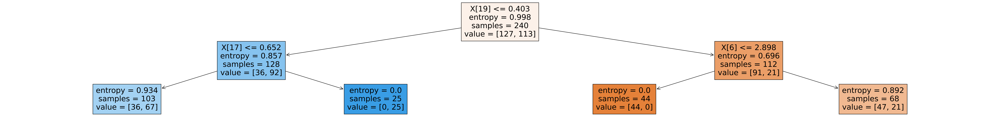

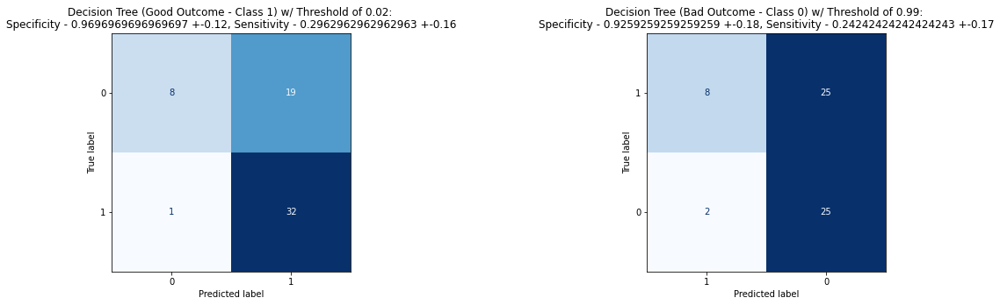

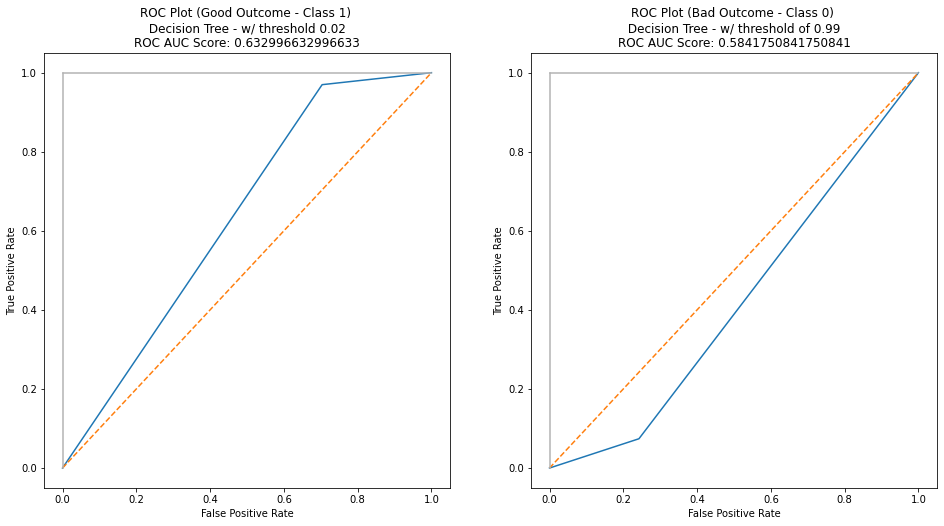


********************************** RANDOM FOREST - 12 HOURS ******************************************
For random forest:
training accuracy 0.9625
testing accuracy 0.8166666666666667
              precision    recall  f1-score   support

           0       0.92      0.41      0.56        27
           1       0.67      0.97      0.79        33

    accuracy                           0.72        60
   macro avg       0.79      0.69      0.68        60
weighted avg       0.78      0.72      0.69        60

              precision    recall  f1-score   support

           1       1.00      0.03      0.06        33
           0       0.46      1.00      0.63        27

    accuracy                           0.47        60
   macro avg       0.73      0.52      0.34        60
weighted avg       0.76      0.47      0.31        60



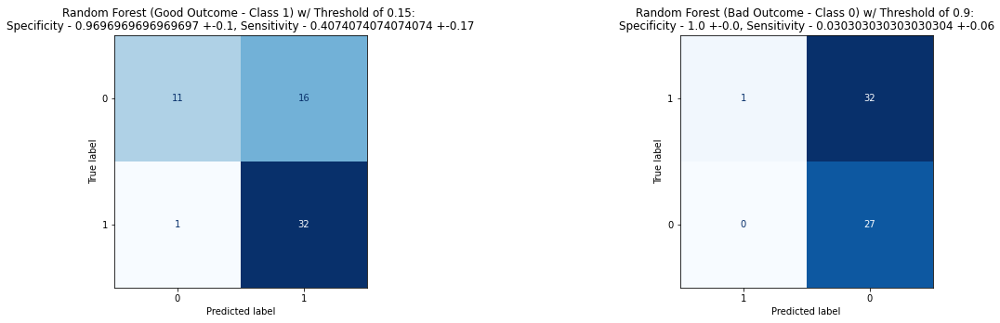

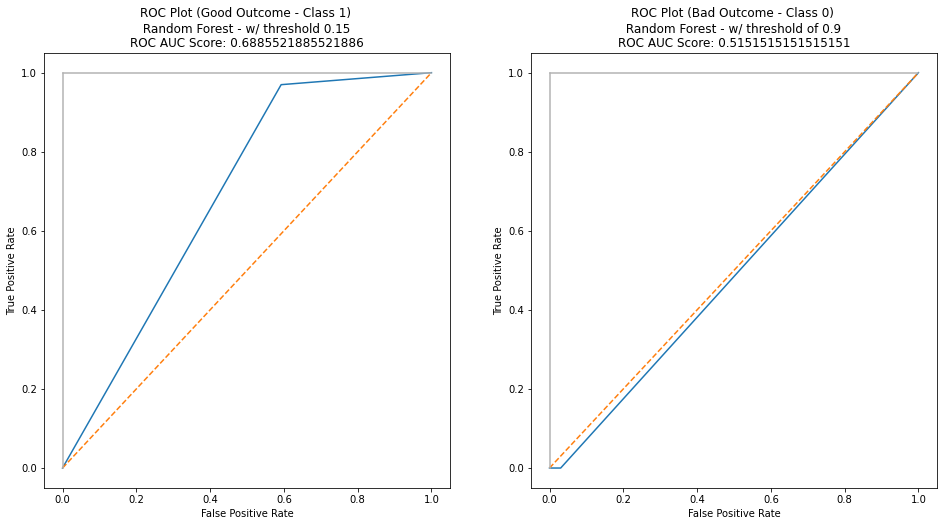


****************************** GAUSSIAN NAIVE BAYES - 12 HOURS ***************************************
For Naive Bayes:
training accuracy 0.6875
testing accuracy 0.7833333333333333
              precision    recall  f1-score   support

           0       1.00      0.48      0.65        27
           1       0.70      1.00      0.82        33

    accuracy                           0.77        60
   macro avg       0.85      0.74      0.74        60
weighted avg       0.84      0.77      0.75        60

              precision    recall  f1-score   support

           1       1.00      0.06      0.11        33
           0       0.47      1.00      0.64        27

    accuracy                           0.48        60
   macro avg       0.73      0.53      0.37        60
weighted avg       0.76      0.48      0.35        60



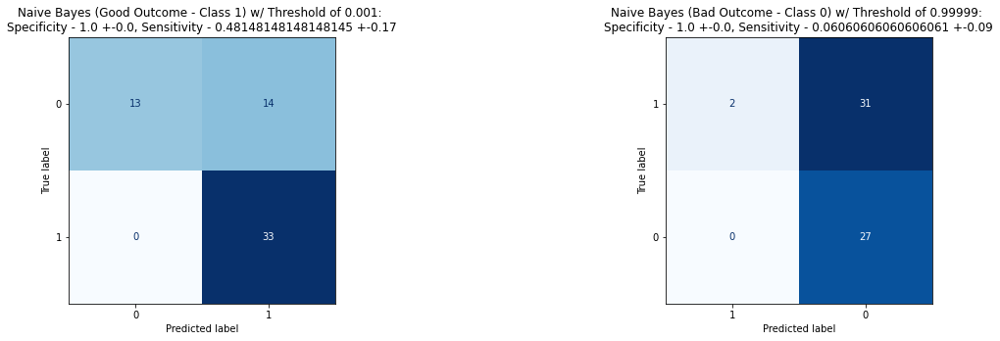

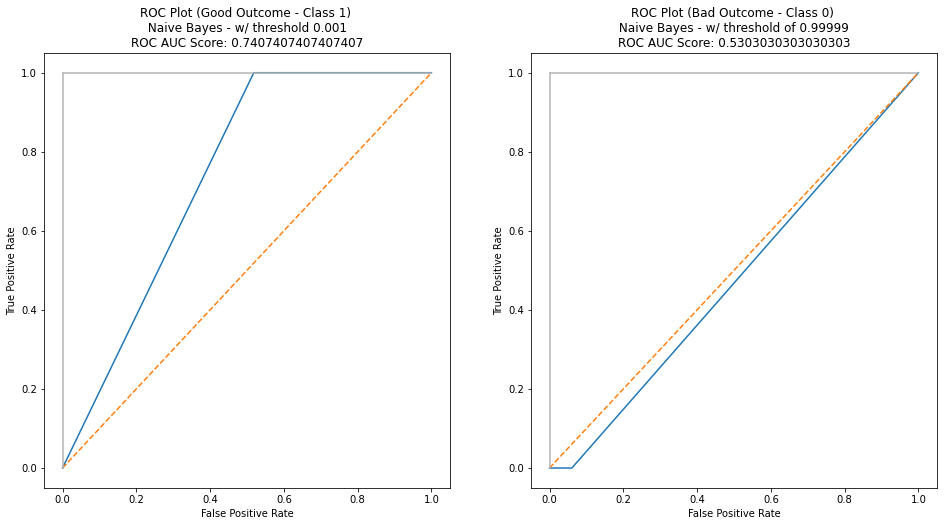


************************************** SVC - 12 HOURS ************************************************
For SVC Model:
training accuracy 0.5291666666666667
testing accuracy 0.45
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        27
           1       0.55      1.00      0.71        33

    accuracy                           0.55        60
   macro avg       0.28      0.50      0.35        60
weighted avg       0.30      0.55      0.39        60

              precision    recall  f1-score   support

           1       0.00      0.00      0.00        33
           0       0.45      1.00      0.62        27

    accuracy                           0.45        60
   macro avg       0.23      0.50      0.31        60
weighted avg       0.20      0.45      0.28        60



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classificat

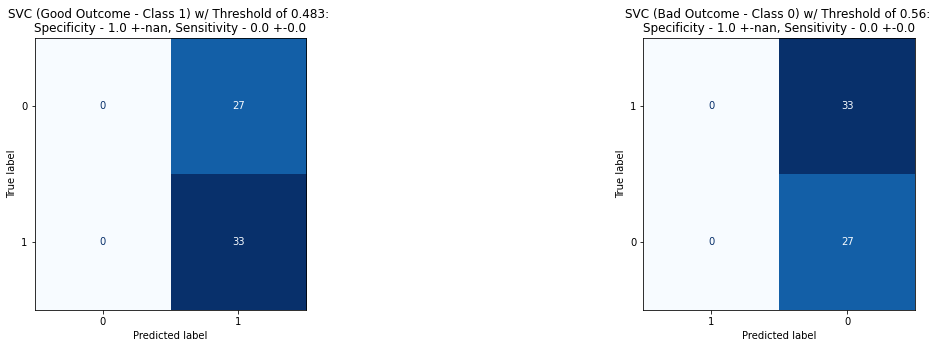

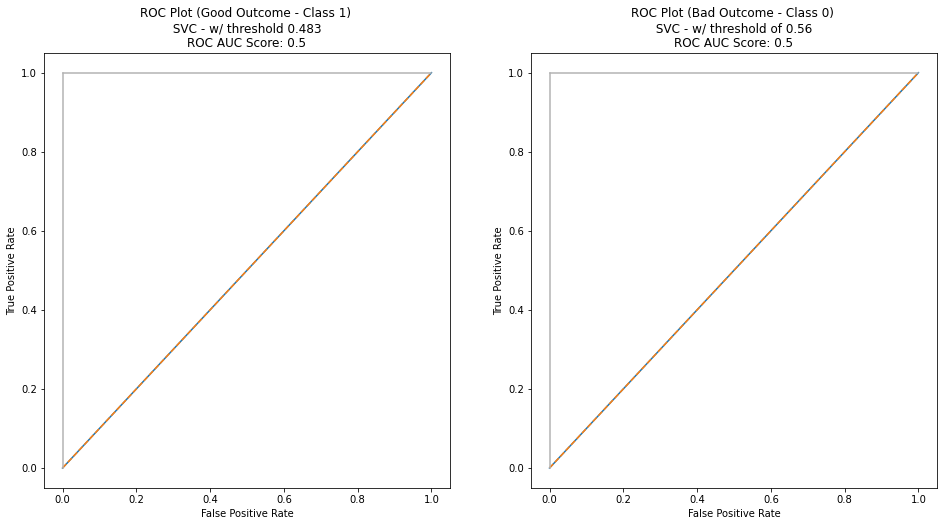

SVC(C=0.1, gamma=0.001, kernel='poly', probability=True)

In [28]:
################  LOG MODEL AND THRESHHOLD ##############
print('***************************** LOGISTIC REGRESSION - 12 HOURS *****************************************')
threshold = [0.30, 0.95]
x_train, x_test, y_train, y_test = selectProperFeatures(x_train, y_train, x_test, y_test, 'log')
log_reg(x_train, y_train, x_test, y_test, threshold)

print()

################# DECISION TREE MODEL AND THRESHHOLD ##############
print('*********************************** DECISION TREE - 12 HOURS *****************************************')
threshold = [0.02, 0.99]
x_train, x_test, y_train, y_test = selectProperFeatures(x_train, y_train, x_test, y_test, 'dec')
dec_tree(x_train, y_train, x_test, y_test, threshold)

print()

################# RANDOM FOREST MODEL AND THRESHHOLD ##############
print('********************************** RANDOM FOREST - 12 HOURS ******************************************')
threshold = [0.15, 0.90]
x_train, x_test, y_train, y_test = selectProperFeatures(x_train, y_train, x_test, y_test, 'ran')
random_forest(x_train, y_train, x_test, y_test, threshold)

print()

################# NAIVE BAYES MODEL AND THRESHHOLD ##############
print('****************************** GAUSSIAN NAIVE BAYES - 12 HOURS ***************************************')
threshold = [1e-3, 1-1e-5]
x_train, x_test, y_train, y_test = selectProperFeatures(x_train, y_train, x_test, y_test, 'gauss')
naive_bayes(x_train, y_train, x_test, y_test, threshold)

print()

################# SVC MODEL AND THRESHHOLD ##############
print('************************************** SVC - 12 HOURS ************************************************')
threshold = [0.483, 0.56]
x_train, x_test, y_train, y_test = selectProperFeatures(x_train, y_train, x_test, y_test, 'svc')
svc_model(x_train, y_train, x_test, y_test, threshold)

#### Using 24 hours dataset

In [29]:
x_train, x_test, y_train, y_test = train_test_split(x_24, y_24, train_size=0.8, test_size=0.2, random_state=15)

In [30]:
loadParams(x_train, y_train, '24hr')

***************************** LOGISTIC REGRESSION - 24 HOURS *****************************************
For logistic regression:
training accuracy 0.8333333333333334
testing accuracy 0.7833333333333333
              precision    recall  f1-score   support

           0       0.86      0.22      0.35        27
           1       0.60      0.97      0.74        33

    accuracy                           0.63        60
   macro avg       0.73      0.60      0.55        60
weighted avg       0.72      0.63      0.57        60

              precision    recall  f1-score   support

           1       1.00      0.18      0.31        33
           0       0.50      1.00      0.67        27

    accuracy                           0.55        60
   macro avg       0.75      0.59      0.49        60
weighted avg       0.78      0.55      0.47        60



/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


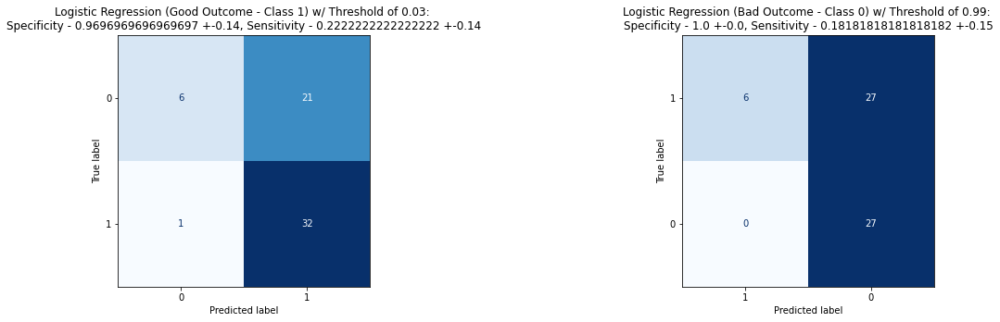

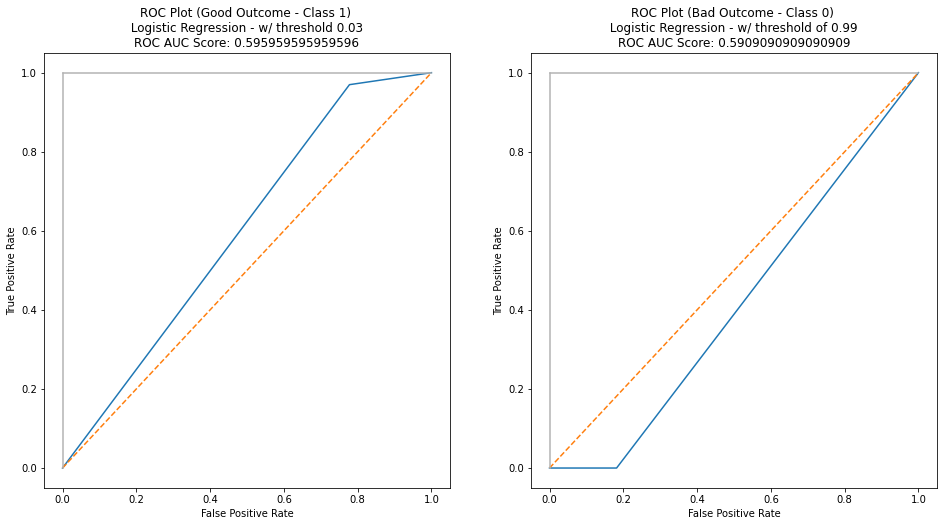


*********************************** DECISION TREE - 24 HOURS *****************************************
For decision tree:
training accuracy 0.8333333333333334
testing accuracy 0.6666666666666666
The decision tree is saved!
              precision    recall  f1-score   support

           0       0.83      0.19      0.30        27
           1       0.59      0.97      0.74        33

    accuracy                           0.62        60
   macro avg       0.71      0.58      0.52        60
weighted avg       0.70      0.62      0.54        60

              precision    recall  f1-score   support

           1       0.00      0.00      0.00        33
           0       0.45      1.00      0.62        27

    accuracy                           0.45        60
   macro avg       0.23      0.50      0.31        60
weighted avg       0.20      0.45      0.28        60



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/tmp/ipykernel_488/243264019.py:30: RuntimeWarning: invalid value e

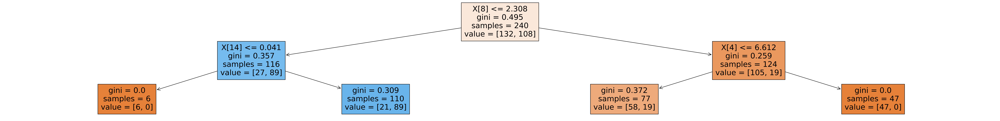

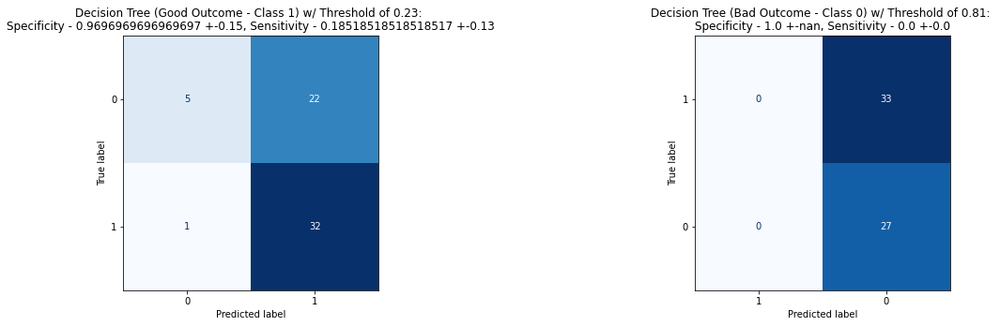

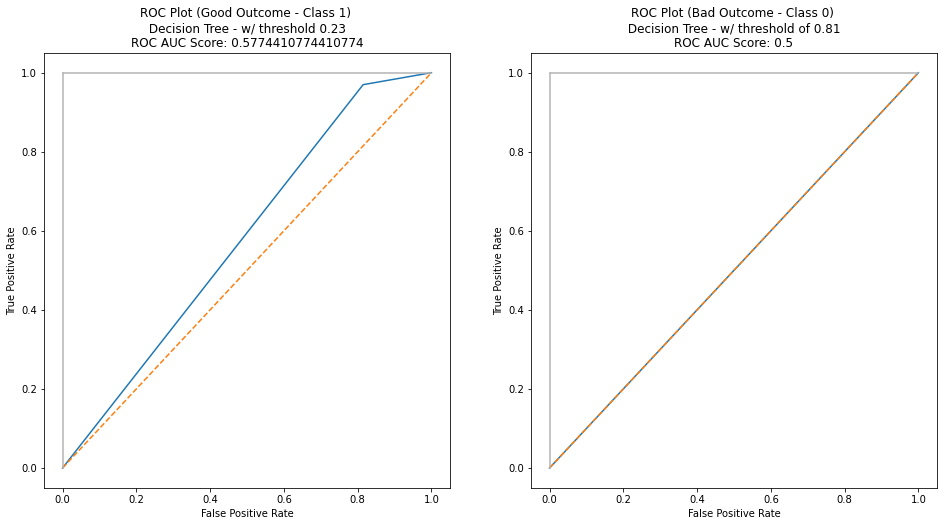


********************************** RANDOM FOREST - 24 HOURS ******************************************
For random forest:
training accuracy 0.8708333333333333
testing accuracy 0.75
              precision    recall  f1-score   support

           0       1.00      0.37      0.54        27
           1       0.66      1.00      0.80        33

    accuracy                           0.72        60
   macro avg       0.83      0.69      0.67        60
weighted avg       0.81      0.72      0.68        60

              precision    recall  f1-score   support

           1       1.00      0.12      0.22        33
           0       0.48      1.00      0.65        27

    accuracy                           0.52        60
   macro avg       0.74      0.56      0.43        60
weighted avg       0.77      0.52      0.41        60



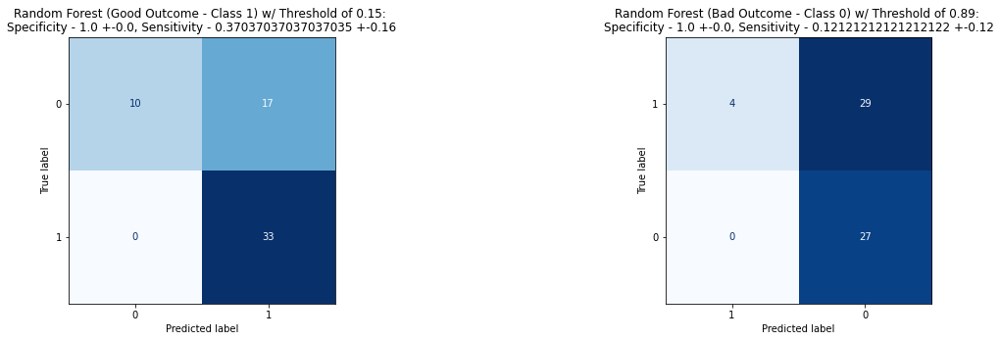

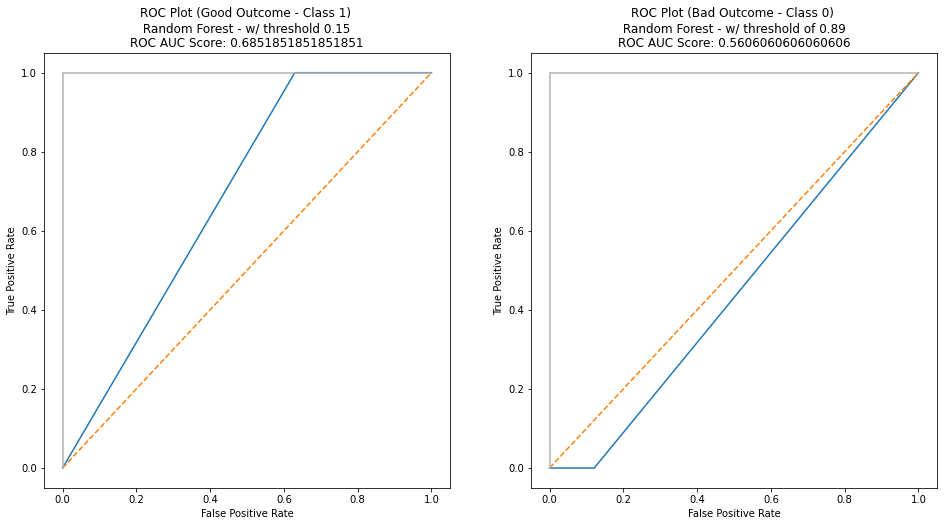


****************************** GAUSSIAN NAIVE BAYES - 24 HOURS ***************************************
For Naive Bayes:
training accuracy 0.7666666666666667
testing accuracy 0.7333333333333333
              precision    recall  f1-score   support

           0       1.00      0.44      0.62        27
           1       0.69      1.00      0.81        33

    accuracy                           0.75        60
   macro avg       0.84      0.72      0.72        60
weighted avg       0.83      0.75      0.73        60

              precision    recall  f1-score   support

           1       0.00      0.00      0.00        33
           0       0.45      1.00      0.62        27

    accuracy                           0.45        60
   macro avg       0.23      0.50      0.31        60
weighted avg       0.20      0.45      0.28        60



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/tmp/ipykernel_488/243264019.py:30: RuntimeWarning: invalid value e

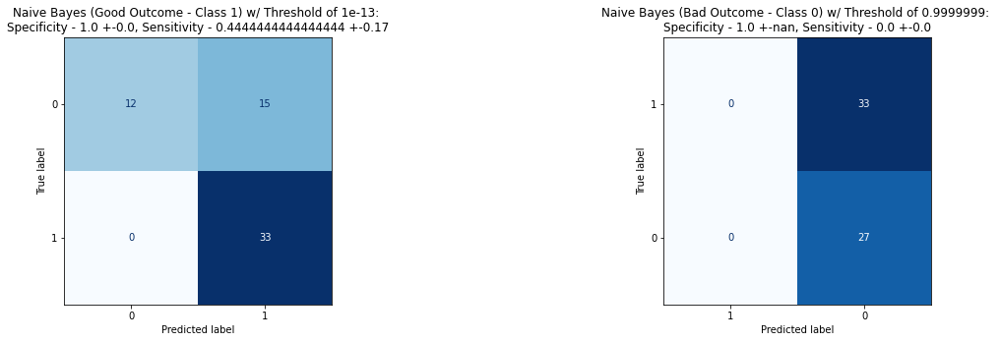

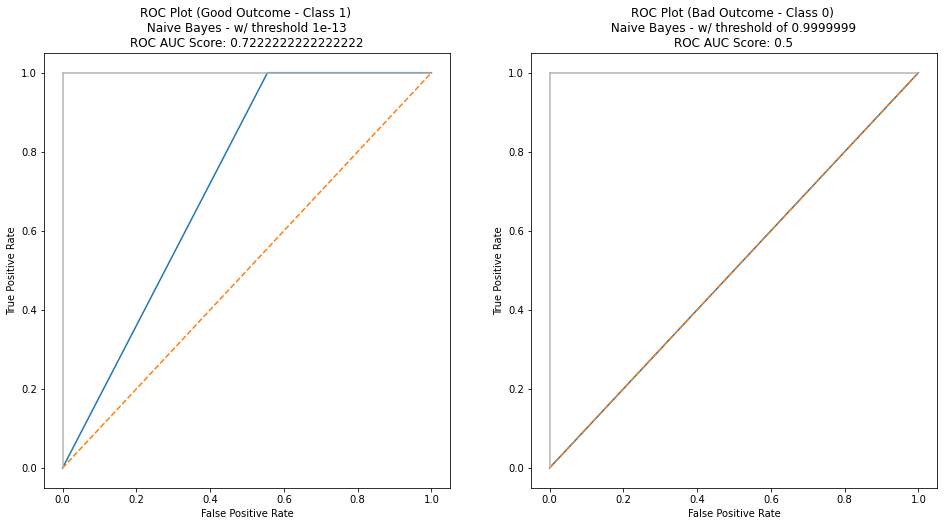


************************************** SVC - 24 HOURS ************************************************
For SVC Model:
training accuracy 0.7458333333333333
testing accuracy 0.6333333333333333
              precision    recall  f1-score   support

           0       1.00      0.19      0.31        27
           1       0.60      1.00      0.75        33

    accuracy                           0.63        60
   macro avg       0.80      0.59      0.53        60
weighted avg       0.78      0.63      0.55        60

              precision    recall  f1-score   support

           1       1.00      0.15      0.26        33
           0       0.49      1.00      0.66        27

    accuracy                           0.53        60
   macro avg       0.75      0.58      0.46        60
weighted avg       0.77      0.53      0.44        60



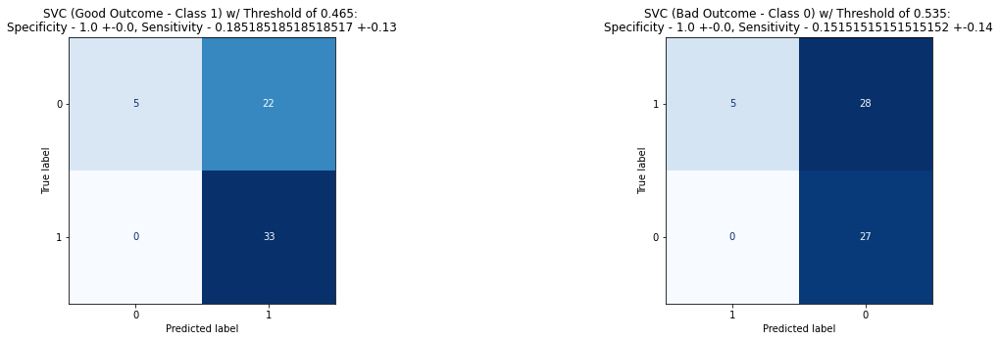

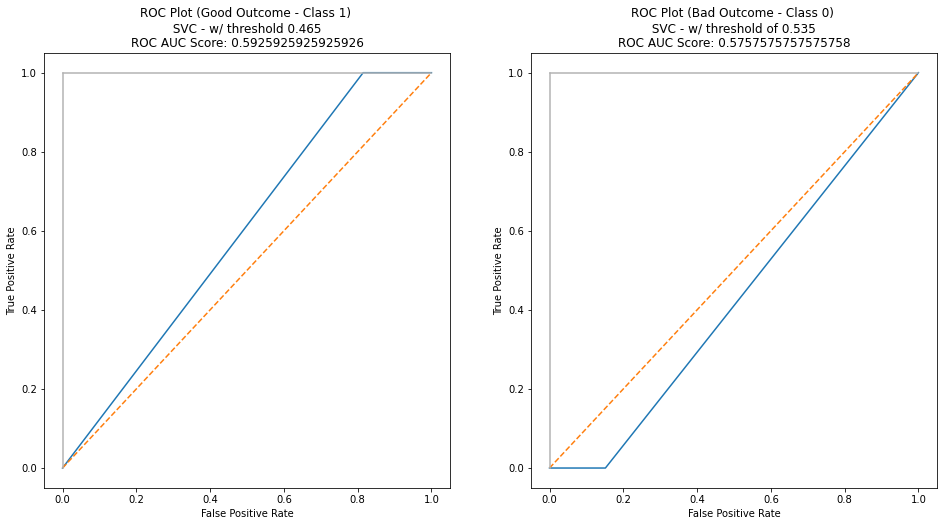

SVC(C=0.01, gamma=0.001, kernel='poly', probability=True)

In [31]:
################  LOG MODEL AND THRESHHOLD ##############
print('***************************** LOGISTIC REGRESSION - 24 HOURS *****************************************')
threshold = [0.03, 0.99]
x_train, x_test, y_train, y_test = selectProperFeatures(x_train, y_train, x_test, y_test, 'log')
log_reg(x_train, y_train, x_test, y_test, threshold)

print()

################# DECISION TREE MODEL AND THRESHHOLD ##############
print('*********************************** DECISION TREE - 24 HOURS *****************************************')
threshold = [0.23, 0.81]
x_train, x_test, y_train, y_test = selectProperFeatures(x_train, y_train, x_test, y_test, 'dec')
dec_tree(x_train, y_train, x_test, y_test, threshold)

print()

################# RANDOM FOREST MODEL AND THRESHHOLD ##############
print('********************************** RANDOM FOREST - 24 HOURS ******************************************')
threshold = [0.15, 0.89]
x_train, x_test, y_train, y_test = selectProperFeatures(x_train, y_train, x_test, y_test, 'ran')
random_forest(x_train, y_train, x_test, y_test, threshold)

print()

################# NAIVE BAYES MODEL AND THRESHHOLD ##############
print('****************************** GAUSSIAN NAIVE BAYES - 24 HOURS ***************************************')
threshold = [1e-13, 1-1e-7]
x_train, x_test, y_train, y_test = selectProperFeatures(x_train, y_train, x_test, y_test, 'gauss')
naive_bayes(x_train, y_train, x_test, y_test, threshold)

print()

################# SVC MODEL AND THRESHHOLD ##############
print('************************************** SVC - 24 HOURS ************************************************')
threshold = [0.465, 0.535]
x_train, x_test, y_train, y_test = selectProperFeatures(x_train, y_train, x_test, y_test, 'svc')
svc_model(x_train, y_train, x_test, y_test, threshold)